# 00. Integration and analysis of scRNA-seq data from MOC1res, MOC1sens, MOC1iso tumors

Tumors were implanted subcutaneously and treated with anti–PD‑1 (MOC1res and MOC1sens) or isotype control IgG (MOC1iso). After 30 days, tumors were harvested for scRNA‑seq. Cells were counted and pooled to a final composition of 30 % CD45⁺ and 70 % CD45⁻ prior to GEM generation.

In [1]:
import scvi
import scanpy as sc
import pandas as pd
import numpy as np
from scipy.stats import median_abs_deviation as mad
import anndata as ad
import matplotlib as mpl
from matplotlib.pyplot import rc_context
#from cnmf import cNMF
import seaborn as sns
import os
import matplotlib.pyplot as plt
from adjustText import adjust_text
import catheat
from matplotlib.patheffects import withStroke
from matplotlib.lines import Line2D
import random
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
import re

%load_ext rpy2.ipython

In [2]:
sc.set_figure_params(dpi_save = 600, fontsize = 12)

## 0. Read in the raw counts

In [2]:
adatai = sc.read_10x_mtx('/path/to/filtered_feature_bc_matrix', cache = True)
adatas = sc.read_10x_mtx('/path/to/filtered_feature_bc_matrix', cache = True)
adatar = sc.read_10x_mtx('/path/to/filtered_feature_bc_matrix', cache = True)

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


## 1. Cell- and gene-level filtering

In [3]:
def pp(adata):
    sc.pp.filter_genes(adata, min_cells=3)
    adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
    adata.var['rb'] = adata.var_names.str.startswith(('Rps','Rpl'))  # annotate the group of ribosomal proteins as 'rb'
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
    sc.pp.calculate_qc_metrics(adata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)
    conditions = [
        (adata.obs['n_genes_by_counts'] < 500),
        (adata.obs['pct_counts_mt'] > 25),
        (adata.obs['pct_counts_rb'] > 30),
        (adata.obs['pct_counts_mt'] <= 25) & 
        (adata.obs['n_genes_by_counts'] >= 500) & 
        (adata.obs['pct_counts_rb'] <= 30)
    ]
    
    values = ['Low_nFeature', 'High_MT','High_RB', 'Pass']
    adata.obs['QC'] = np.select(conditions, values)
    adata.obs['QC'] = adata.obs['QC'].astype('category')
    adata.obs[['n_genes_by_counts','pct_counts_mt','QC']].head(10)
    adata_filt = adata[adata.obs['QC'] == 'Pass']
    print(adata.obs['QC'].value_counts())
    return(adata_filt)

In [4]:
adatai = pp(adatai)
adatas = pp(adatas)
adatar = pp(adatar)

QC
Pass            10055
Low_nFeature     1695
High_MT           365
High_RB            86
Name: count, dtype: int64
QC
Pass            8504
Low_nFeature    1147
High_MT          198
High_RB            8
Name: count, dtype: int64
QC
Pass            5564
Low_nFeature    1624
High_MT          221
High_RB           50
Name: count, dtype: int64


In [5]:
sc.pp.highly_variable_genes(adatai, n_top_genes = 4000, subset = True, flavor = 'seurat_v3')
sc.pp.highly_variable_genes(adatas, n_top_genes = 4000, subset = True, flavor = 'seurat_v3')
sc.pp.highly_variable_genes(adatar, n_top_genes = 4000, subset = True, flavor = 'seurat_v3')

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:148: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': 'seurat_v3'}
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:148: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': 'seurat_v3'}
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:148: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': 'seurat_v3'}


## 2. Train scVI model

In [6]:
scvi.model.SCVI.setup_anndata(adatai)
vaei = scvi.model.SCVI(adatai)
vaei.train()

scvi.model.SCVI.setup_anndata(adatas)
vaes = scvi.model.SCVI(adatas)
vaes.train()

scvi.model.SCVI.setup_anndata(adatar)
vaer = scvi.model.SCVI(adatar)
vaer.train()

<frozen abc>:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 1/400:   0%|                                      | 0/400 [00:00<?, ?it/s]

<frozen abc>:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.



Epoch 400/400: 100%|█| 400/400 [27:15<00:00,  4.07s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [27:15<00:00,  4.09s/it, v_num=1, train_loss_step

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs



Epoch 400/400: 100%|█| 400/400 [23:12<00:00,  3.40s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [23:12<00:00,  3.48s/it, v_num=1, train_loss_step

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs



Epoch 400/400: 100%|█| 400/400 [14:38<00:00,  2.04s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [14:38<00:00,  2.20s/it, v_num=1, train_loss_step


## 3. Doublet detection training of SOLO model

In [7]:
soloi = scvi.external.SOLO.from_scvi_model(vaei)
soloi.train()

solos = scvi.external.SOLO.from_scvi_model(vaes)
solos.train()

solor = scvi.external.SOLO.from_scvi_model(vaer)
solor.train()

INFO     Creating doublets, preparing SOLO model.                                                                  


/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 176/400:  44%|▍| 176/400 [00:46<00:58,  3.82it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.351. Signaling Trainer to stop.
INFO     Creating doublets, preparing SOLO model.                                                                  


/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 149/400:  37%|▎| 149/400 [00:32<00:54,  4.59it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.361. Signaling Trainer to stop.
INFO     Creating doublets, preparing SOLO model.                                                                  


/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 273/400:  68%|▋| 273/400 [00:39<00:18,  6.86it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.338. Signaling Trainer to stop.


In [10]:
dfi = soloi.predict()
dfi['prediction'] = soloi.predict(soft = False)
dfi.index = dfi.index.map(lambda x: x[:-2])
print(len(dfi[dfi.prediction == 'doublet']))
dfi.rename(lambda x: str(x) + '-1', inplace=True)
dfi

dfs = solos.predict()
dfs['prediction'] = solos.predict(soft = False)
dfs.index = dfs.index.map(lambda x: x[:-2])
print(len(dfs[dfs.prediction == 'doublet']))
dfs.rename(lambda x: str(x) + '-1', inplace=True)
dfs

dfr = solor.predict()
dfr['prediction'] = solor.predict(soft = False)
dfr.index = dfr.index.map(lambda x: x[:-2])
print(len(dfr[dfr.prediction == 'doublet']))
dfr.rename(lambda x: str(x) + '-1', inplace=True)
dfr

3389
2637
1232


,doublet,singlet,prediction
AAACCCACATAACAGA-1,0.696617,-0.802028,doublet
AAACCCATCCATGCAA-1,-2.398229,0.836625,singlet
AAACCCATCGGTCGGT-1,-0.429310,0.961522,singlet
AAACGAACAGGGTTGA-1,-0.247893,-0.413852,doublet
AAACGAAGTGATTCTG-1,-1.489537,1.647176,singlet
...,...,...,...
TTTGTTGTCAGACAAA-1,-1.087191,0.346454,singlet
TTTGTTGTCATCGACA-1,-0.951634,-0.078057,singlet
TTTGTTGTCGCGGTAC-1,0.098299,-0.007637,doublet
TTTGTTGTCGGTCATA-1,-2.674275,2.214534,singlet


In [11]:
def plot_doublets(adata_filt, df):
    adata_filt.obs['prediction'] = df.prediction
    sc.pp.normalize_total(adata_filt, target_sum = 1e4)
    sc.pp.log1p(adata_filt)
    adata_filt.raw = adata_filt
    sc.tl.pca(adata_filt)
    sc.pp.neighbors(adata_filt)
    sc.tl.umap(adata_filt)
    sc.tl.leiden(adata_filt, resolution = 0.5)
    sc.pl.umap(adata_filt, color = ['leiden', 'prediction'])

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  col

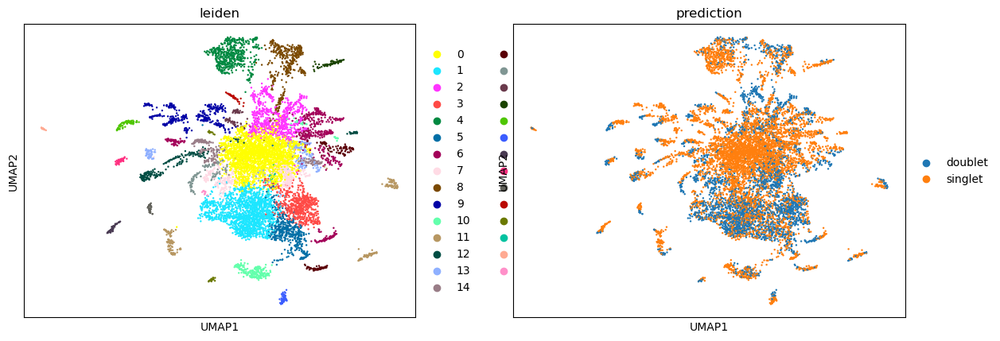

In [12]:
plot_doublets(adatai, dfi)

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  col

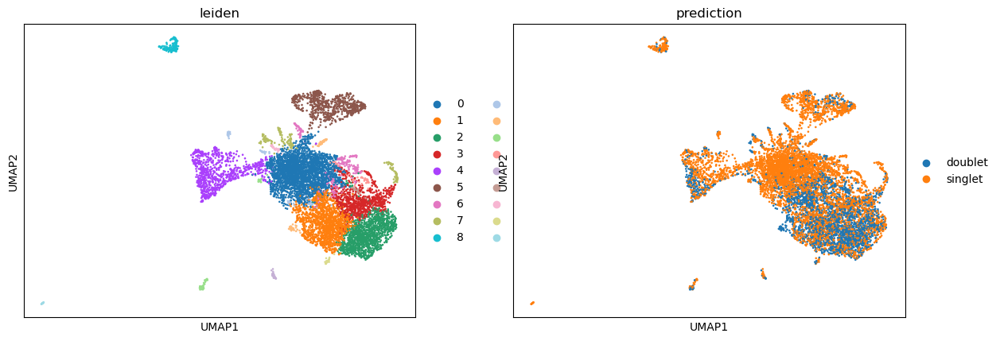

In [13]:
plot_doublets(adatas, dfs)

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  col

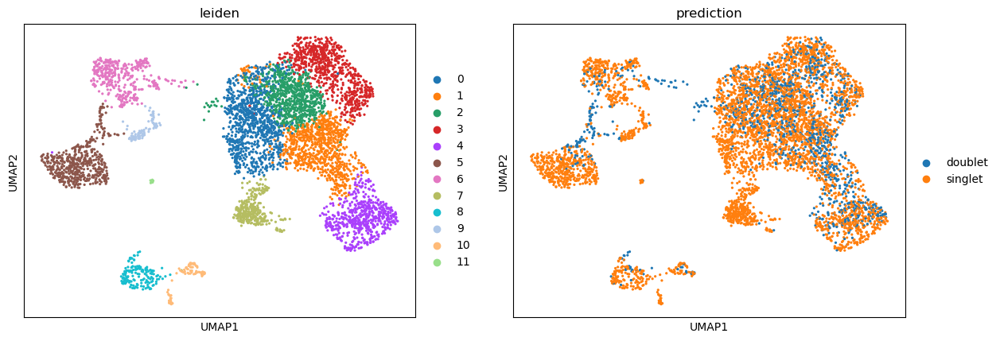

In [14]:
plot_doublets(adatar, dfr)

## 4. Remove doublets

In [18]:
doublet_di = dict(zip(dfi.index, dfi.prediction))
doublet_ds = dict(zip(dfs.index, dfs.prediction))
doublet_dr = dict(zip(dfr.index, dfr.prediction))

In [24]:
adatai = sc.read_10x_mtx('/path/to/filtered_feature_bc_matrix', cache = True)
adatas = sc.read_10x_mtx('/path/to/filtered_feature_bc_matrix', cache = True)
adatar = sc.read_10x_mtx('/path/to/filtered_feature_bc_matrix', cache = True)

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [23]:
adatai.var_names_make_unique()
adatas.var_names_make_unique()
adatar.var_names_make_unique()

In [25]:
def label_dubsi(x):
    try:
        return doublet_di[x]
    except:
        return 'filtered'

def label_dubss(x):
    try:
        return doublet_ds[x]
    except:
        return 'filtered'

def label_dubsr(x):
    try:
        return doublet_dr[x]
    except:
        return 'filtered'

In [26]:
adatai.obs['doublet'] = adatai.obs.index.map(label_dubsi)
adatas.obs['doublet'] = adatas.obs.index.map(label_dubss)
adatar.obs['doublet'] = adatar.obs.index.map(label_dubsr)

In [27]:
adatai = adatai[adatai.obs.doublet == 'singlet']
adatas = adatas[adatas.obs.doublet == 'singlet']
adatar = adatar[adatar.obs.doublet == 'singlet']

In [29]:
adatai.write_h5ad('MOC1_iso_pp_singlets.h5ad')
adatas.write_h5ad('MOC1_sens_pp_singlets.h5ad')
adatar.write_h5ad('MOC1_res_pp_singlets.h5ad')

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1292: ImplicitMo

In [67]:
# Filter cells directly by cellID
adatai = sc.read_10x_mtx('/path/to/filtered_feature_bc_matrix', cache = True)
adatas = sc.read_10x_mtx('/path/to/filtered_feature_bc_matrix', cache = True)
adatar = sc.read_10x_mtx('/path/to/filtered_feature_bc_matrix', cache = True)

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [68]:
sc.pp.filter_genes(adatai, min_cells=3)
sc.pp.filter_genes(adatas, min_cells=3)
sc.pp.filter_genes(adatar, min_cells=3)

In [69]:
cells_i = list(pd.read_csv('/path/to/MOC1_iso_cellIDs_for_integration.csv')['0'])
cells_s = list(pd.read_csv('/path/to/MOC1_sens/QC/MOC1_sens_cellIDs_for_integration.csv')['0'])
cells_r = list(pd.read_csv('/path/to/MOC1_res_cellIDs_for_integration.csv')['0'])

In [70]:
adatai = adatai[adatai.obs.index.isin(cells_i)]
adatas = adatas[adatas.obs.index.isin(cells_s)]
adatar = adatar[adatar.obs.index.isin(cells_r)]

In [71]:
sc.pp.highly_variable_genes(adatai, n_top_genes = 4000, subset = True, flavor = 'seurat_v3')
sc.pp.highly_variable_genes(adatas, n_top_genes = 4000, subset = True, flavor = 'seurat_v3')
sc.pp.highly_variable_genes(adatar, n_top_genes = 4000, subset = True, flavor = 'seurat_v3')

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:148: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': 'seurat_v3'}
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:148: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': 'seurat_v3'}
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:148: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': 'seurat_v3'}


### Train scVI (round 2)

In [72]:
scvi.model.SCVI.setup_anndata(adatai)
vaei = scvi.model.SCVI(adatai)
vaei.train()

scvi.model.SCVI.setup_anndata(adatas)
vaes = scvi.model.SCVI(adatas)
vaes.train()

scvi.model.SCVI.setup_anndata(adatar)
vaer = scvi.model.SCVI(adatar)
vaer.train()

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 400/400: 100%|█| 400/400 [15:32<00:00,  2.22s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [15:32<00:00,  2.33s/it, v_num=1, train_loss_step

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs



Epoch 400/400: 100%|█| 400/400 [18:01<00:00,  2.52s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [18:01<00:00,  2.70s/it, v_num=1, train_loss_step

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs



Epoch 400/400: 100%|█| 400/400 [2:14:24<00:00,  2.18s/it, v_num=1, train_loss_st

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [2:14:24<00:00, 20.16s/it, v_num=1, train_loss_st


### Doublet detection (round 2)

In [73]:
soloi = scvi.external.SOLO.from_scvi_model(vaei)
soloi.train()
solos = scvi.external.SOLO.from_scvi_model(vaes)
solos.train()
solor = scvi.external.SOLO.from_scvi_model(vaer)
solor.train()

INFO     Creating doublets, preparing SOLO model.                                                                  


/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 292/400:  73%|▋| 292/400 [00:44<00:16,  6.60it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.379. Signaling Trainer to stop.
INFO     Creating doublets, preparing SOLO model.                                                                  


/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 178/400:  44%|▍| 178/400 [00:30<00:37,  5.88it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.370. Signaling Trainer to stop.
INFO     Creating doublets, preparing SOLO model.                                                                  


/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 261/400:  65%|▋| 261/400 [00:32<00:17,  7.99it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.317. Signaling Trainer to stop.


In [74]:
dfi = soloi.predict()
dfi['prediction'] = soloi.predict(soft = False)
dfi.index = dfi.index.map(lambda x: x[:-2])
print(len(dfi[dfi.prediction == 'doublet']))
dfi.rename(lambda x: str(x) + '-1', inplace=True)
dfi

dfs = solos.predict()
dfs['prediction'] = solos.predict(soft = False)
dfs.index = dfs.index.map(lambda x: x[:-2])
print(len(dfs[dfs.prediction == 'doublet']))
dfs.rename(lambda x: str(x) + '-1', inplace=True)
dfs

dfr = solor.predict()
dfr['prediction'] = solor.predict(soft = False)
dfr.index = dfr.index.map(lambda x: x[:-2])
print(len(dfr[dfr.prediction == 'doublet']))
dfr.rename(lambda x: str(x) + '-1', inplace=True)
dfr

1963
1885
1028


,doublet,singlet,prediction
AAACCCACATAACAGA-1,1.449399,-0.917065,doublet
AAACCCATCCATGCAA-1,-1.327817,2.070310,singlet
AAACCCATCGGTCGGT-1,-1.264591,0.787802,singlet
AAACGAACAGGGTTGA-1,0.821606,-0.109796,doublet
AAACGAAGTGATTCTG-1,-1.499838,1.759666,singlet
...,...,...,...
TTTGTTGGTGTATTGC-1,-0.511885,0.830076,singlet
TTTGTTGGTTTCCCAC-1,0.360399,-0.122347,doublet
TTTGTTGTCAGACAAA-1,-1.247324,1.385517,singlet
TTTGTTGTCATCGACA-1,-0.599143,0.808451,singlet


In [76]:
def plot_doublets(adata_filt, df):
    adata_filt.obs['prediction'] = df.prediction
    sc.pp.normalize_total(adata_filt, target_sum = 1e4)
    sc.pp.log1p(adata_filt)
    adata_filt.raw = adata_filt
    sc.tl.pca(adata_filt)
    sc.pp.neighbors(adata_filt)
    sc.tl.umap(adata_filt)
    sc.tl.leiden(adata_filt, resolution = 0.5)
    sc.pl.umap(adata_filt, color = ['leiden', 'prediction'])

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  col

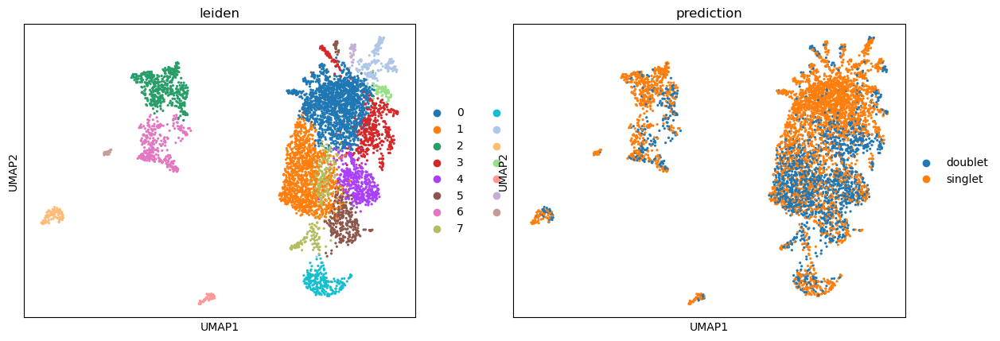

In [77]:
plot_doublets(adatai, dfi)

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  col

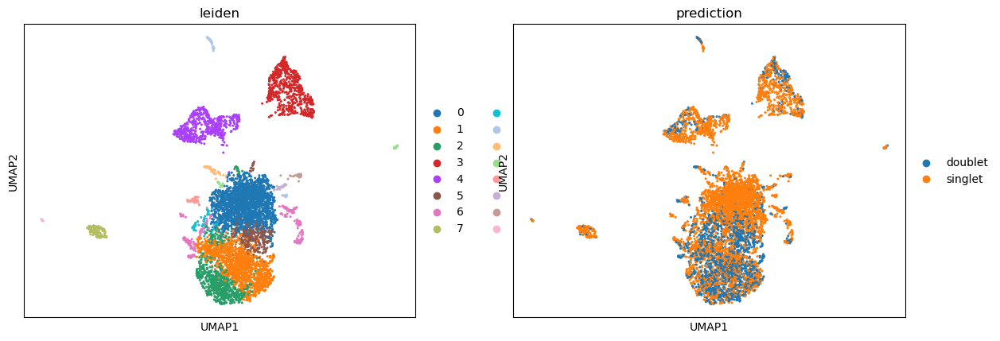

In [88]:
plot_doublets(adatas, dfs)

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  col

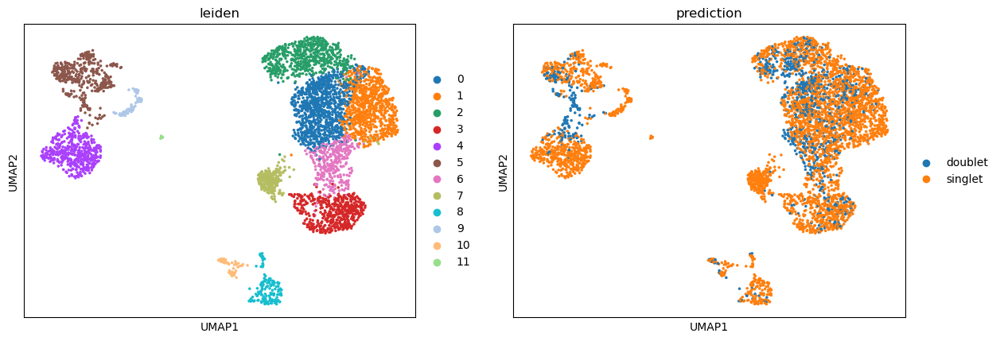

In [90]:
plot_doublets(adatar, dfr)

### Remove doublets (round 2)

In [91]:
doublet_di = dict(zip(dfi.index, dfi.prediction))
doublet_ds = dict(zip(dfs.index, dfs.prediction))
doublet_dr = dict(zip(dfr.index, dfr.prediction))

In [93]:
adatai = sc.read_10x_mtx('/path/to/filtered_feature_bc_matrix', cache = True)
adatas = sc.read_10x_mtx('/path/to/filtered_feature_bc_matrix', cache = True)
adatar = sc.read_10x_mtx('/path/to/filtered_feature_bc_matrix', cache = True)

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [94]:
adatai.var_names_make_unique()
adatas.var_names_make_unique()
adatar.var_names_make_unique()

In [95]:
def label_dubsi(x):
    try:
        return doublet_di[x]
    except:
        return 'filtered'

def label_dubss(x):
    try:
        return doublet_ds[x]
    except:
        return 'filtered'

def label_dubsr(x):
    try:
        return doublet_dr[x]
    except:
        return 'filtered'

In [96]:
adatai.obs['doublet'] = adatai.obs.index.map(label_dubsi)
adatas.obs['doublet'] = adatas.obs.index.map(label_dubss)
adatar.obs['doublet'] = adatar.obs.index.map(label_dubsr)

In [97]:
adatai.obs

,doublet
AAACCCAAGACATACA-1,filtered
AAACCCAAGCGATGCA-1,singlet
AAACCCACAATTAGGA-1,singlet
AAACCCACACGACAAG-1,filtered
AAACCCACAGACAAAT-1,doublet
...,...
TTTGTTGGTATCACGT-1,filtered
TTTGTTGGTCGCTTAA-1,doublet
TTTGTTGTCCATTGTT-1,filtered
TTTGTTGTCCTCTAGC-1,filtered


In [98]:
adatai = adatai[adatai.obs.doublet == 'singlet']
adatas = adatas[adatas.obs.doublet == 'singlet']
adatar = adatar[adatar.obs.doublet == 'singlet']

In [99]:
adatai.write_h5ad('MOC1_iso_pp_singlets_select.h5ad')
adatas.write_h5ad('MOC1_sens_pp_singlets_select.h5ad')
adatar.write_h5ad('MOC1_res_pp_singlets_select.h5ad')

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1292: ImplicitMo

## 5. Detect ambient RNA

SoupX with RPy2.

Code from sanbomics: https://github.com/mousepixels/sanbomics_scripts/blob/main/soupX/soupX_python_test.ipynb

In [106]:
def get_soupx_group(adata):
    adata_pp = adata.copy()
    sc.pp.normalize_per_cell(adata_pp)
    sc.pp.log1p(adata_pp)
    sc.pp.pca(adata_pp)
    sc.pp.neighbors(adata_pp)
    sc.tl.leiden(adata_pp, key_added="soupx_groups")
    return adata_pp.obs['soupx_groups']

def prepare_broth(adata, file_path):
    # Make into individual components to pass to R
    cells = adata.obs_names
    genes = adata.var_names
    data = adata.X.T
    
    #extract raw data
    raw = sc.read_10x_mtx(file_path, cache = True).X.T
 
    #get leiden clusters
    soupx_groups = get_soupx_group(adata)

    return data, raw, genes, cells, soupx_groups

In [101]:
%%R
#install.packages('SoupX')
library(SoupX)

make_soup <- function(data, raw, genes, cells, soupx_groups){
    # specify row and column names of data
    rownames(data) = genes
    colnames(data) = cells
    # ensure correct sparse format for table of counts and table of droplets
    data <- as(data, "sparseMatrix")
    raw <- as(raw, "sparseMatrix")

    # Generate SoupChannel Object for SoupX 
    sc = SoupChannel(raw, data, calcSoupProfile = FALSE)

    # Add extra meta data to the SoupChannel object
    soupProf = data.frame(row.names = rownames(data), est = rowSums(data)/sum(data), counts = rowSums(data))
    sc = setSoupProfile(sc, soupProf)
    # Set cluster information in SoupChannel
    sc = setClusters(sc, soupx_groups)

    # Estimate contamination fraction
    sc  = autoEstCont(sc, doPlot=FALSE)
    # Infer corrected table of counts and round to integer
    out = adjustCounts(sc, roundToInt = TRUE)
    
    return(out)
}


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)


In [107]:
def cook_soup(adata, file_path):
    data, raw, genes, cells, soupx_groups = prepare_broth(adata, file_path)

    # Execute the R code and get the corrected counts
    %R -i data -i raw -i genes -i cells -i soupx_groups -o out out = make_soup(data, raw, genes, cells, soupx_groups)


    adata.layers["raw_counts"] = adata.X
    adata.layers["soupX_counts"] = out.T
    adata.X = adata.layers["soupX_counts"]
    
    return adata

In [108]:
iso_filepath = '/path/to/filtered_feature_bc_matrix'
sens_filepath = '/path/to/filtered_feature_bc_matrix'
res_filepath = '/path/to/filtered_feature_bc_matrix'

adatai_soupx = cook_soup(adatai, iso_filepath)
adatas_soupx = cook_soup(adatas, sens_filepath)
adatar_soupx = cook_soup(adatar, res_filepath)

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


2314 genes passed tf-idf cut-off and 737 soup quantile filter.  Taking the top 100.
Using 1887 independent estimates of rho.
Estimated global rho of 0.01
Expanding counts from 26 clusters to 3674 cells.
In addition: Warning message:
In sparseMatrix(i = out@i[w] + 1, j = out@j[w] + 1, x = out@x[w],  :
  'giveCsparse' is deprecated; setting repr="T" for you


/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


1458 genes passed tf-idf cut-off and 485 soup quantile filter.  Taking the top 100.
Using 1958 independent estimates of rho.
Estimated global rho of 0.01
Expanding counts from 29 clusters to 4426 cells.
In addition: Warning message:
In sparseMatrix(i = out@i[w] + 1, j = out@j[w] + 1, x = out@x[w],  :
  'giveCsparse' is deprecated; setting repr="T" for you


/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


1356 genes passed tf-idf cut-off and 140 soup quantile filter.  Taking the top 100.
Using 855 independent estimates of rho.
Estimated global rho of 0.01
Expanding counts from 15 clusters to 3589 cells.
In addition: Warning message:
In sparseMatrix(i = out@i[w] + 1, j = out@j[w] + 1, x = out@x[w],  :
  'giveCsparse' is deprecated; setting repr="T" for you


In [109]:
print(adatai[0].layers['soupX_counts'].sum()/adatai[0].layers['raw_counts'].sum())
print(adatas[0].layers['soupX_counts'].sum()/adatas[0].layers['raw_counts'].sum())
print(adatar[0].layers['soupX_counts'].sum()/adatar[0].layers['raw_counts'].sum())

0.990832600778601
0.9931699477701889
0.9895683008287635


In [110]:
beforei = adatai.layers['raw_counts'].copy()
afteri = adatai.layers['soupX_counts'].copy()
beforei.data = np.where(beforei.data > 0, 1, 0) #binarized before soupX
afteri.data = np.where(afteri.data > 0, 1, 0) #binarized soupX
diffi = beforei - afteri #if went from 1 to 0 the diff will be 1, all other 0 or -1
changedi = (diffi == 1).astype(int) #binary matrix, will be 1 if was taken out, otherwise 0


befores = adatas.layers['raw_counts'].copy()
afters = adatas.layers['soupX_counts'].copy()
befores.data = np.where(befores.data > 0, 1, 0) #binarized before soupX
afters.data = np.where(afters.data > 0, 1, 0) #binarized soupX
diffs = befores - afters #if went from 1 to 0 the diff will be 1, all other 0 or -1
changeds = (diffs == 1).astype(int) #binary matrix, will be 1 if was taken out, otherwise 0


beforer = adatar.layers['raw_counts'].copy()
afterr = adatar.layers['soupX_counts'].copy()
beforer.data = np.where(beforer.data > 0, 1, 0) #binarized before soupX
afterr.data = np.where(afterr.data > 0, 1, 0) #binarized soupX
diffr = beforer - afterr #if went from 1 to 0 the diff will be 1, all other 0 or -1
changedr = (diffr == 1).astype(int) #binary matrix, will be 1 if was taken out, otherwise 0

In [111]:
adatai.layers['changed'] = changedi
adatas.layers['changed'] = changeds
adatar.layers['changed'] = changedr

In [112]:
adatai.var['soupX_removed'] = adatai.layers['changed'].sum(axis = 0).A1 #num cells gene was subtracted from
adatas.var['soupX_removed'] = adatas.layers['changed'].sum(axis = 0).A1 #num cells gene was subtracted from
adatar.var['soupX_removed'] = adatar.layers['changed'].sum(axis = 0).A1 #num cells gene was subtracted from

In [116]:
adatar.var.sort_values('soupX_removed', ascending = False)[0:20]

,gene_ids,feature_types,soupX_removed
Psca,ENSMUSG00000022598,Gene Expression,361
Krt14,ENSMUSG00000045545,Gene Expression,242
Apoe,ENSMUSG00000002985,Gene Expression,221
Ltf,ENSMUSG00000032496,Gene Expression,210
Ppbp,ENSMUSG00000029372,Gene Expression,192
Cxcl2,ENSMUSG00000058427,Gene Expression,191
Gsto1,ENSMUSG00000025068,Gene Expression,189
AA467197,ENSMUSG00000033213,Gene Expression,179
Lgals7,ENSMUSG00000053522,Gene Expression,174
Il1b,ENSMUSG00000027398,Gene Expression,147


In [117]:
adatar.write_h5ad('adata_res_soupX.h5ad')
adatas.write_h5ad('adata_sens_soupX.h5ad')
adatai.write_h5ad('adata_iso_soupX.h5ad')

In [136]:
adatar.obs['sample'] = 'Resistant'
adatas.obs['sample'] = 'Sensitive'
adatai.obs['sample'] = 'Isotype'

## 6. Integrate the processed adata objects

In [144]:
adata = sc.concat([adatar, adatas, adatai])

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [145]:
adata

AnnData object with n_obs × n_vars = 11689 × 32285
    obs: 'doublet', 'sample'
    layers: 'raw_counts', 'soupX_counts', 'changed'

In [146]:
adata.obs_names_make_unique()

In [147]:
adata.layers

Layers with keys: raw_counts, soupX_counts, changed

In [148]:
adata.layers['soupX_counts'] = adata.X.copy() # counts to be used for pseudobulk DEG analysis

In [149]:
adata.obs

,doublet,sample
AAACCCATCCATGCAA-1,singlet,Resistant
AAACCCATCGGTCGGT-1,singlet,Resistant
AAACGAAGTGATTCTG-1,singlet,Resistant
AAAGAACAGTAGCAAT-1,singlet,Resistant
AAAGAACAGTCAGGGT-1,singlet,Resistant
...,...,...
TTTGGTTTCGCCATAA-1,singlet,Isotype
TTTGTTGCAACATCGT-1,singlet,Isotype
TTTGTTGCAGAACTAA-1,singlet,Isotype
TTTGTTGCATGACGTT-1,singlet,Isotype


In [150]:
#normalize data
sc.pp.normalize_total(adata, target_sum = 1e4)
sc.pp.log1p(adata)
adata.raw = adata

In [151]:
sc.pp.highly_variable_genes(adata, n_top_genes=3000, subset = True, layer = 'soupX_counts',
                           flavor = "seurat_v3", batch_key="sample")

Train scVI model.

In [152]:
scvi.model.SCVI.setup_anndata(adata, layer = "soupX_counts", categorical_covariate_keys=["sample"])

<frozen abc>:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.



In [153]:
model = scvi.model.SCVI(adata)

In [154]:
model

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Not Trained
Model's adata is minified?: False

In [155]:
model.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 1/400:   0%|                                      | 0/400 [00:00<?, ?it/s]

<frozen abc>:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.



Epoch 400/400: 100%|█| 400/400 [22:17<00:00,  2.88s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [22:17<00:00,  3.34s/it, v_num=1, train_loss_step


In [156]:
latent = model.get_latent_representation()

In [157]:
latent.shape

(11689, 10)

In [158]:
adata.obsm['X_scVI'] = latent

In [159]:
adata.layers['scvi_normalized'] = model.get_normalized_expression(library_size = 1e4)

In [160]:
adata.obs

,doublet,sample,_scvi_batch,_scvi_labels
AAACCCATCCATGCAA-1,singlet,Resistant,0,0
AAACCCATCGGTCGGT-1,singlet,Resistant,0,0
AAACGAAGTGATTCTG-1,singlet,Resistant,0,0
AAAGAACAGTAGCAAT-1,singlet,Resistant,0,0
AAAGAACAGTCAGGGT-1,singlet,Resistant,0,0
...,...,...,...,...
TTTGGTTTCGCCATAA-1,singlet,Isotype,0,0
TTTGTTGCAACATCGT-1,singlet,Isotype,0,0
TTTGTTGCAGAACTAA-1,singlet,Isotype,0,0
TTTGTTGCATGACGTT-1,singlet,Isotype,0,0


In [162]:
sc.pp.neighbors(adata, use_rep = 'X_scVI')
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution = 0.7)

In [757]:
colors = {'sensitive':'green','resistant':'firebrick','isotype':'gold'}


/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


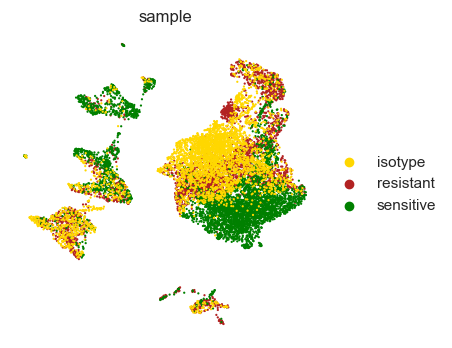

In [1058]:
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color = ['sample'], frameon = False, palette = colors)

In [205]:
adata.write_h5ad('MOC1_scVI_res_sens_iso_integ.h5ad')

In [10]:
adata = sc.read_h5ad('MOC1_scVI_res_sens_iso_integ.h5ad')

## 7. Run NMF

Start by writing a counts file for the scvi_normalized layer of adata.

In [100]:
dense_data = pd.DataFrame(adata.layers['scvi_normalized'], index=adata.obs.index, columns=adata.var.index)
dense_data.head()

,Xkr4,Sox17,St18,2610203C22Rik,Cpa6,Prex2,Sulf1,Slco5a1,Eya1,Kcnb2,...,Arhgap6,Mid1,Gm15726,Gm21860,Gm47283,AC133103.1,AC168977.2,AC168977.1,AC132444.1,Csprs
AAACCCATCCATGCAA-1,0.102888,0.012944,0.023862,0.173316,0.827763,0.024625,1.797869,0.001145,0.002311,0.581901,...,0.692731,14.396823,0.010851,0.043071,0.578956,0.079513,0.025794,0.246101,0.000322,0.014887
AAACCCATCGGTCGGT-1,0.034328,0.000186,0.000192,0.987431,0.055742,0.023171,0.868816,0.000883,0.000082,0.104402,...,0.011481,0.688042,0.014414,0.000169,0.147863,0.791190,0.832347,5.220407,1.068565,1.242572
AAACGAAGTGATTCTG-1,0.346045,0.012742,2.869097,0.081768,0.245984,0.060559,0.011071,0.000689,0.006784,0.001563,...,0.397255,1.136719,0.856892,0.066480,5.109251,0.034650,0.021287,0.014999,0.000030,0.184357
AAAGAACAGTAGCAAT-1,0.038074,0.010854,0.004377,1.129088,0.235254,0.420293,1.137201,0.003696,0.000084,0.161234,...,0.048147,1.347616,0.058501,0.006397,0.301767,1.809742,1.188717,9.256971,0.902871,1.758436
AAAGAACAGTCAGGGT-1,0.015410,0.002142,0.062120,0.267192,22.953081,0.105741,2.755625,0.042195,0.401481,1.879652,...,0.754084,30.308701,0.001517,0.000236,0.405390,0.322958,0.835737,1.870981,0.000267,1.734045


In [237]:
dense_data.to_csv('scvi_counts_table.tsv', sep='\t')

In [2]:
numiter=200 
numhvgenes=2000 ## Number of over-dispersed genes to use for running the actual factorizations

## Results will be saved to [output_directory]/[run_name]
output_directory = 'cNMF_outs_run2'
if not os.path.exists(output_directory):
    os.mkdir(output_directory)
run_name = 'cNMF_run2'


K = np.arange(10,18)

seed = 14 ## Specify a seed pseudorandom number generation for reproducibility
count_txt_fn = './scvi_counts_table.tsv'

In [3]:
## Initialize the cnmf object that will be used to run analyses
cnmf_obj = cNMF(output_dir=output_directory, name=run_name)

In [4]:
cnmf_obj.prepare(counts_fn=count_txt_fn, components=K, n_iter=numiter, seed=seed, num_highvar_genes=numhvgenes)

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [5]:
cnmf_obj.factorize(worker_i=0, total_workers=1)

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Worker 0]. Starting task 10.
[Worker 0]. Starting task 11.
[Worker 0]. Starting task 12.
[Worker 0]. Starting task 13.
[Worker 0]. Starting task 14.
[Worker 0]. Starting task 15.
[Worker 0]. Starting task 16.
[Worker 0]. Starting task 17.
[Worker 0]. Starting task 18.
[Worker 0]. Starting task 19.
[Worker 0]. Starting task 20.
[Worker 0]. Starting task 21.
[Worker 0]. Starting task 22.
[Worker 0]. Starting task 23.
[Worker 0]. Starting task 24.
[Worker 0]. Starting task 25.
[Worker 0]. Starting task 26.
[Worker 0]. Starting task 27.
[Worker 0]. Starting task 28.
[Worker 0]. Starting task 29.
[Worker 0]. Starting task 30.
[Worker 0]. Starting task 31.
[Worker 0]. Starting task 32.
[Worker 0]. Starting

In [6]:
cnmf_obj.combine()

Combining factorizations for k=10.
Combining factorizations for k=11.
Combining factorizations for k=12.
Combining factorizations for k=13.
Combining factorizations for k=14.
Combining factorizations for k=15.
Combining factorizations for k=16.
Combining factorizations for k=17.


/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-pa

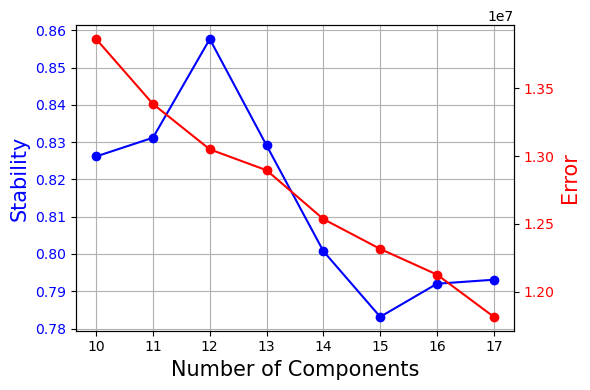

In [8]:
cnmf_obj.k_selection_plot(close_fig=False)

In [9]:
selected_K = 17
density_threshold = 0.05

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


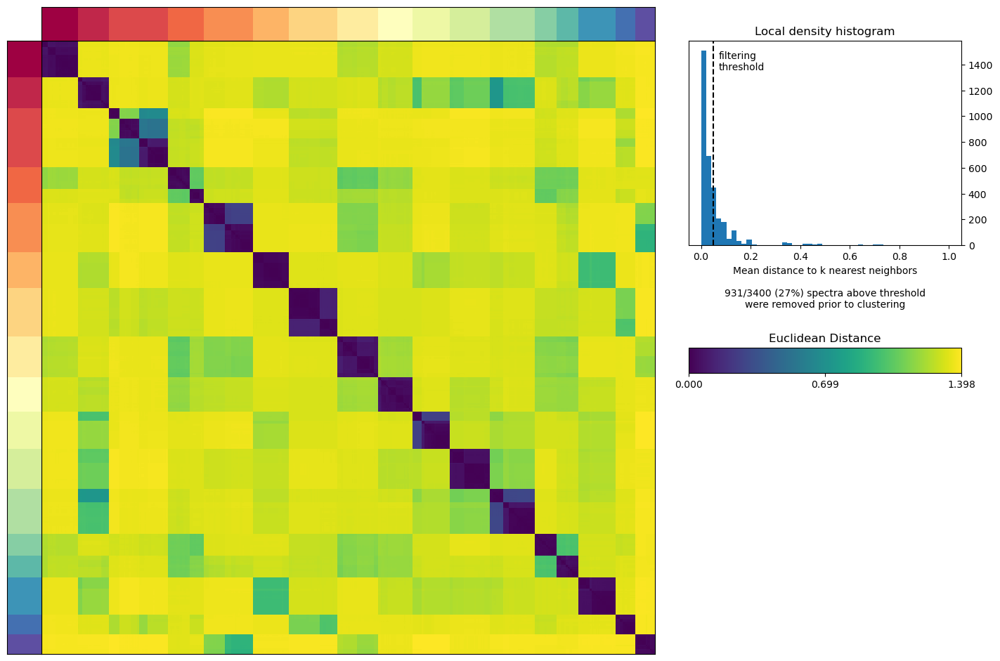

In [10]:
cnmf_obj.consensus(k=selected_K, density_threshold=density_threshold, show_clustering=True, close_clustergram_fig=False)

In [11]:
def pp(counts):
    adata = sc.read(counts)
    hvgs = open('./cNMF_outs_run1/cNMF_run1/cNMF_run1.overdispersed_genes.txt').read().split('\n')
    #sc.pp.normalize_total(adata, target_sum=1e4) These steps were already performed.
    #sc.pp.log1p(adata) These steps were already performed.
    adata.raw=adata
    adata = adata[:,hvgs]
    sc.pp.scale(adata, max_value=10)
    sc.pp.pca(adata, svd_solver='arpack')
    sc.pl.pca_variance_ratio(adata, log=True)
    return adata

def make_umap(adata, pcs=30):
    sc.pp.neighbors(adata, n_neighbors=15, n_pcs=pcs)
    sc.tl.umap(adata)
    sc.pl.umap(adata, color=['Epcam'],
           use_raw=True, ncols=3)

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


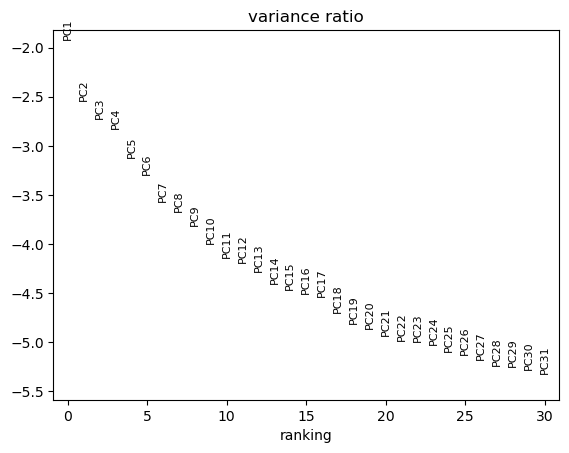

In [12]:
adata = pp(count_txt_fn)

In [15]:
usage_norm, gep_scores, gep_tpm, topgenes = cnmf_obj.load_results(K=selected_K, density_threshold=density_threshold)
usage_norm.columns = ['Usage_%d' % i for i in usage_norm.columns]
adata.obs = pd.merge(left=adata.obs, right=usage_norm, how='left', left_index=True, right_index=True)

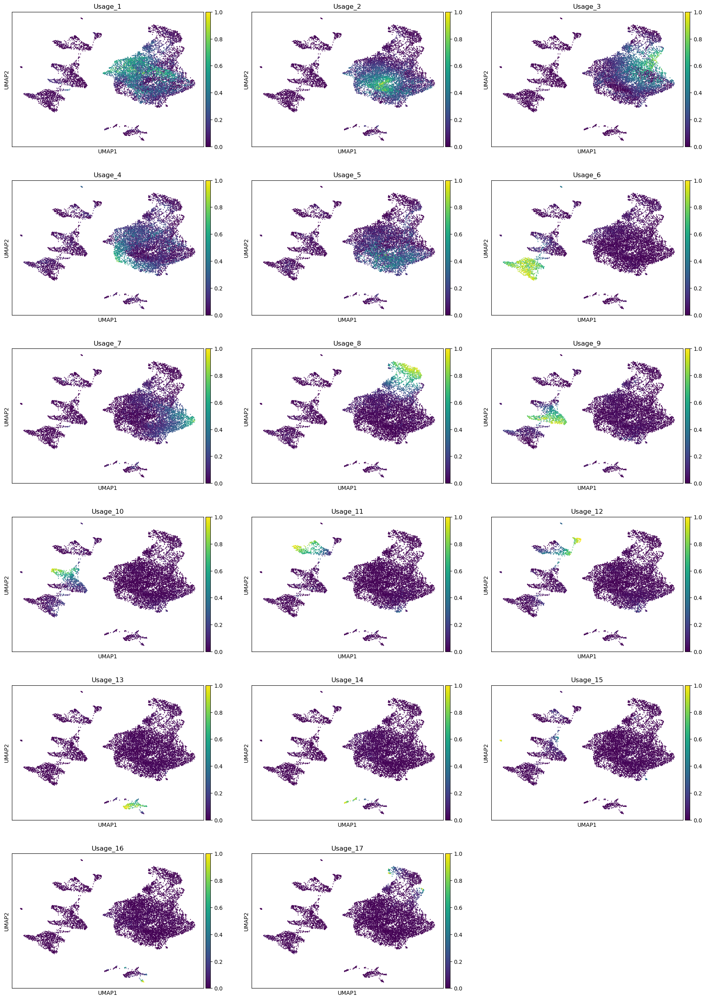

In [16]:
sc.pl.umap(adata, color=usage_norm.columns,
           use_raw=True, ncols=3, vmin=0, vmax=1)

In [17]:
# save top 100 genes for each program (ranked by their loadings)
topgenes.to_csv('k17_integrated_iso_res_sens_NMF_topgenes.csv')

In [18]:
# save this version of adata
adata.write_h5ad('k17_integrated_iso_res_sens_NMF.h5ad')

In [4]:
adata = sc.read_h5ad('k17_integrated_iso_res_sens_NMF.h5ad')

In [25]:
adata.obs['sample'] = 'None'
# Make sure 'cell_type' is initially not categorical
adata.obs['sample'] = adata.obs['sample'].astype('object')

In [26]:
# label samples of origin
for cell in adata.obs.index:
    if cell in adatai.obs.index:
        adata.obs.loc[cell, 'sample'] = 'isotype'
    if cell in adatar.obs.index:
        adata.obs.loc[cell, 'sample'] = 'resistant'
    if cell in adatas.obs.index:
        adata.obs.loc[cell, 'sample'] = 'sensitive'

In [51]:
adata.obs['sample'].value_counts()

sample
Sensitive    4340
Isotype      3638
Resistant    3551
Name: count, dtype: int64

In [29]:
adata = adata[adata.obs['sample']!='None']

In [31]:
# Convert 'cell_type' back to categorical
adata.obs['sample'] = adata.obs['sample'].astype('category')

/var/folders/5n/z6n7v0d52cz96tmj0j15w_g80000gn/T/ipykernel_96672/3158177326.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['sample'] = adata.obs['sample'].astype('category')


## 8. NMF-based cell type annotation

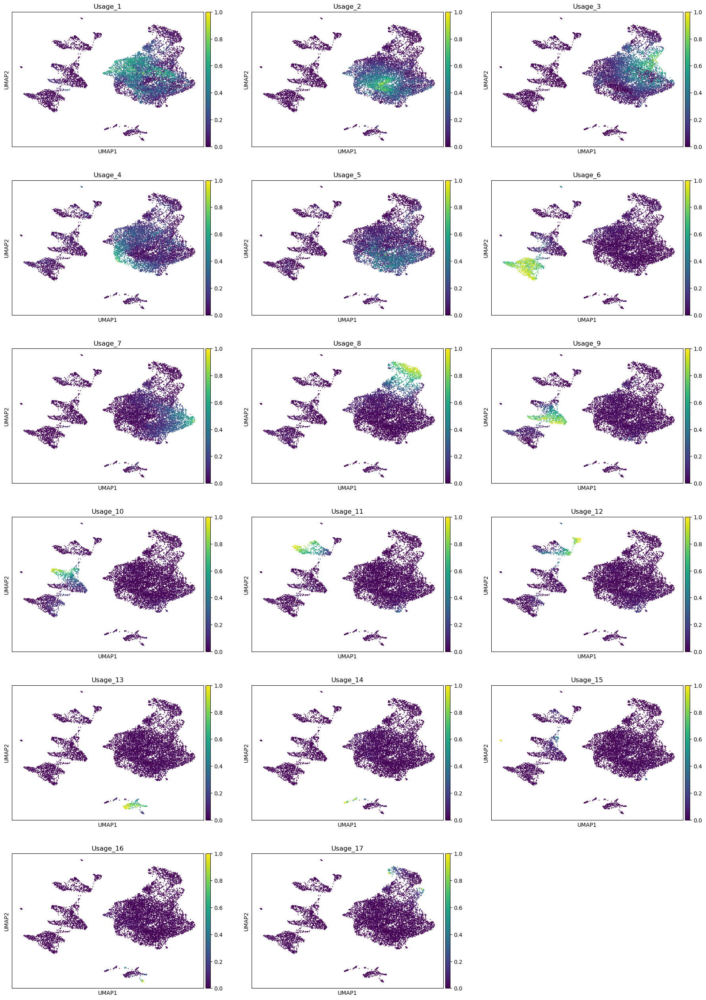

In [96]:
sc.pl.umap(adata, color=usage_norm.columns,
           use_raw=True, ncols=3, vmin=0, vmax=1)

In [100]:
topgenes

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,Tnfrsf12a,Pdgfc,Dsc2,Tob1,Gbp6,Clec4d,Incenp,Prss27,C1qa,Plac8,Ctla4,Gm2682,Adgrl4,Col1a1,Flt3,Reln,Cnfn
1,Prkg2,Slc39a14,Ckmt1,Fosb,Gbp2,Hcar2,Mki67,Elf3,C1qc,Amz1,Trac,Txk,Cdh5,Col5a1,Ccr7,Mmrn1,Klk14
2,Timp1,Col25a1,Calml3,Fos,Iigp1,Clec4e,Knl1,Desi1,C1qb,Apba1,Zap70,Klra7,Esam,Col1a2,4931406G06Rik,Prox1,Klk10
3,Manf,Auts2,Ly6d,Egr1,Cntn1,Acod1,Top2a,Ltf,Ctsz,Gpr141,Icos,Ripor2,Emcn,Col5a2,Strip2,Klhl4,Endou
4,Lgals1,Ntng1,Dapl1,Ier2,Gm4951,Ccrl2,Hmgb2,Pglyrp4,Ms4a7,Ifi207,Cd3d,Sidt1,Col4a2,Col3a1,Rogdi,Gm17167,Klk8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,BB557941,Fads2,Tfcp2l1,Ocln,Skint3,Ftl1,Neil3,Gm49439,Rusc2,Rnase6,Cd28,Spef2,Heg1,En1,Pde10a,Luzp2,Gm45349
96,Adam12,Pde4d,S100a11,1500015L24Rik,Pdlim1,5430425K12Rik,Hist1h2ab,Grhl1,Ms4a6d,Dock3,Plcl1,Gm11290,Efr3b,Hhipl1,Irf8,Kalrn,Cidea
97,Col8a1,Gnai1,Atg9b,Gfpt2,Dnah8,Cdkn1a,Brca1,Gfpt1,Got1,Lyz2,Gpr65,Sytl3,Mcf2l,Des,Stat4,Abca8b,Sult2b1
98,Sfn,Ltbp1,Teddm3,4933405D12Rik,1700120C14Rik,Hilpda,H1f0,Trim16,Clec1b,Cfp,Ptpn22,St8sia4,Kcne3,P3h3,Gfpt1,Fbln5,Atp10b


In [35]:
nmfDict = {
    'Usage_1':'Malignant cells - Hybrid EM', # Lamb3, Krt17, Itgb4, Lamc2, Col4a3
    'Usage_2':'Malignant cells - Wnt/Slit-Robo signaling', # Ror1, Ror2, Robo1,Slit2
    'Usage_3':'Malignant cells - Basal-like', # Kr6a, Fgfbp1, Krt14
    'Usage_4':'Malignant cells - Stress', #Fos, Hspa1a, Hsp1b
    'Usage_5':'Malignant cells - Interferon response/chemotaxis', # Cxcl10, Ccl7, Ifit3, Irf1
    'Usage_6':'myeloid', # Trem1, Arg2, C5ar1, Csf1, Cd14
    'Usage_7':'Malignant cells - Cycling', # Mki67, Birc5, Top2a
    'Usage_8':'Malignant cells - Elf3(+)',
    'Usage_9':'Dendritic cells - Monocyte-derived', # Itgax, C1qa, C1qb
    'Usage_10':'Dendritic cells - Conventional', # Cd83, Cd86
    'Usage_11':'T cells', # Cd3e, Cd8a, Tox
    'Usage_12':'NK cells', # Klrb1c, Dock2
    'Usage_13':'Vascular endothelium', #Vwf, Cdh5?, Egfl7
    'Usage_14':'Fibroblasts', # Col1a1, Col5a1, Acta2
    'Usage_15':'Neutrophils',
    'Usage_16':'Lymphatic endothelium', # Lyve1, Prox1, Cldn5
    'Usage_17':'Malignant cells - Unclassified',
    
} 

In [122]:
adata.obs['NMF_progs'] = adata.obs[['Usage_1', 'Usage_2', 'Usage_3', 'Usage_4',
                                  'Usage_5', 'Usage_6', 'Usage_7', 'Usage_8',
                                  'Usage_9', 'Usage_10','Usage_11','Usage_12','Usage_13',
                                    'Usage_14','Usage_15','Usage_16','Usage_17']].idxmax(axis=1)

adata.obs['NMF_progs']=adata.obs['NMF_progs'].replace(nmfDict)

adata.obs

,Usage_1,Usage_2,Usage_3,Usage_4,Usage_5,Usage_6,Usage_7,Usage_8,Usage_9,Usage_10,...,Usage_12,Usage_13,Usage_14,Usage_15,Usage_16,Usage_17,sample,Rank,Above_Threshold,NMF_progs
AAACCCATCCATGCAA-1,0.451593,0.011212,0.011087,0.145212,0.000000,0.000000,0.352983,0.000000,0.000000,0.004479,...,0.000000,0.003528,0.007553,0.000000,0.006861,0.005492,resistant,0.000279,0,Malignant cells - Hybrid EM
AAACCCATCGGTCGGT-1,0.000000,0.000000,0.000000,0.106434,0.000000,0.057981,0.000000,0.833712,0.001874,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,resistant,0.966211,1,Malignant cells - Elf3(+)
AAACGAAGTGATTCTG-1,0.000000,0.000000,0.000000,0.073692,0.016116,0.000536,0.000000,0.000000,0.751882,0.135686,...,0.022088,0.000000,0.000000,0.000000,0.000000,0.000000,resistant,0.000559,0,Dendritic cells - Monocyte-derived
AAAGAACAGTAGCAAT-1,0.036837,0.002186,0.000000,0.041161,0.000000,0.014232,0.005404,0.878983,0.007953,0.000898,...,0.002057,0.003782,0.001927,0.002715,0.001411,0.000000,resistant,0.981569,1,Malignant cells - Elf3(+)
AAAGAACAGTCAGGGT-1,0.047158,0.337011,0.325280,0.000000,0.234468,0.000000,0.031077,0.000000,0.009748,0.000000,...,0.000000,0.001403,0.006897,0.006957,0.000000,0.000000,resistant,0.000838,0,Malignant cells - Wnt/Slit-Robo signaling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCGCCATAA-1,0.121965,0.000000,0.005010,0.097563,0.000000,0.019106,0.001171,0.637941,0.056622,0.003159,...,0.000000,0.020108,0.000000,0.031705,0.000000,0.000000,isotype,0.970219,1,Malignant cells - Elf3(+)
TTTGTTGCAACATCGT-1,0.000000,0.097681,0.460310,0.303246,0.000000,0.000000,0.012378,0.088364,0.014958,0.000000,...,0.000000,0.002486,0.003383,0.002795,0.008378,0.006020,isotype,0.844262,0,Malignant cells - Basal-like
TTTGTTGCAGAACTAA-1,0.534559,0.310381,0.000000,0.000000,0.067508,0.010517,0.000000,0.017373,0.000000,0.000000,...,0.000000,0.000000,0.017596,0.000000,0.035744,0.000000,isotype,0.499727,0,Malignant cells - Hybrid EM
TTTGTTGCATGACGTT-1,0.125980,0.137180,0.002067,0.120122,0.128468,0.000000,0.464840,0.000000,0.000000,0.000000,...,0.000000,0.007361,0.005802,0.000000,0.006576,0.001604,isotype,0.285246,0,Malignant cells - Cycling


In [123]:
def map_IDs(index):
    usage=list([i for i in topgenes[index][0:99] if i in adata.var_names])
    return usage
    
nmf_genes = {}
for i in np.arange(1, 11):
    usage = map_IDs(i)
    prog = nmfDict['Usage_'+str(i)]
    nmf_genes[prog] = usage
    

In [125]:
adata.layers['scaled'] = sc.pp.scale(adata, copy=True).X

In [126]:
adata.obs.NMF_progs.value_counts()

NMF_progs
Malignant cells - Hybrid EM                         2403
Malignant cells - Wnt/Slit-Robo signaling           1759
Malignant cells - Basal-like                        1574
Macrophages                                          919
Malignant cells - Elf3(+)                            891
Malignant cells - Stress                             858
Malignant cells - Interferon response/chemotaxis     838
Dendritic cells - Monocyte-derived                   614
Malignant cells - Cycling                            497
T cells                                              374
Dendritic cells - Conventional                       307
NK cells                                             251
Vascular endothelium                                 215
Fibroblasts                                           59
Neutrophils                                           44
Malignant cells - Unclassified                        42
Lymphatic endothelium                                 30
Name: count, dtype: i

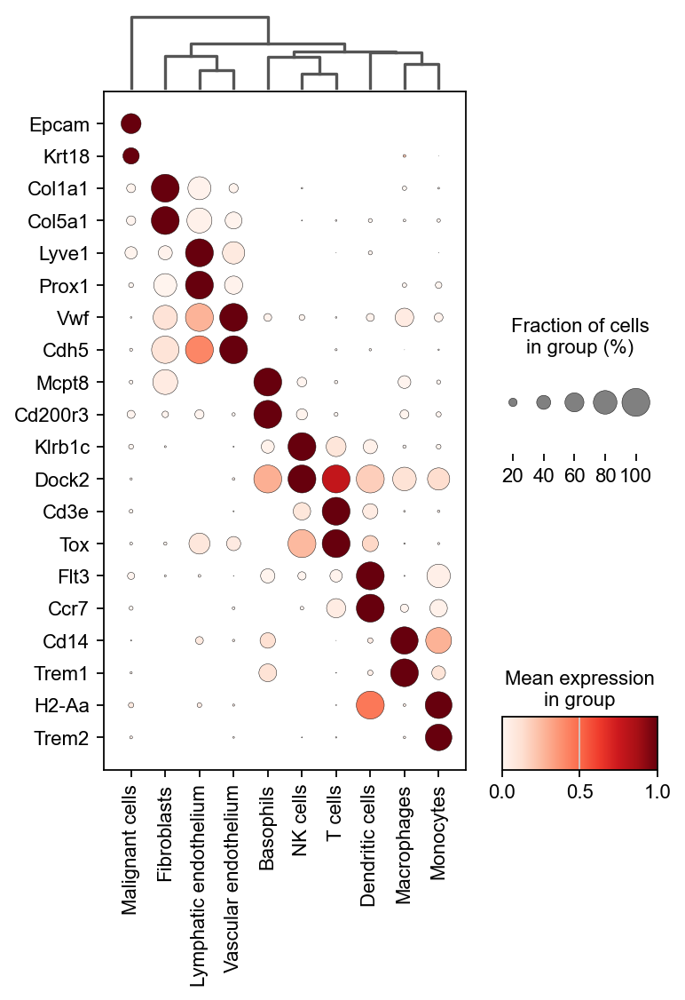

In [45]:
markers = [
'Epcam', 'Krt18',
    'Col1a1','Col5a1',
    'Lyve1','Prox1',
    'Vwf','Cdh5',
    'Mcpt8','Cd200r3',
    'Klrb1c','Dock2',
    'Cd3e','Tox',
    'Flt3','Ccr7',
    'Cd14','Trem1',
    'H2-Aa','Trem2'
]


sc.pl.dotplot(adata, markers, groupby='celltype',layer='scaled', dendrogram=True,
              swap_axes=True, standard_scale='var', mean_only_expressed=False, 
              figsize=(5,7),dot_max=1, save='celltypes_final.png')

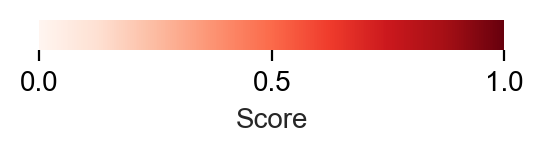

In [48]:
# Create a figure and a dummy mappable for the colorbar
fig, ax = plt.subplots(figsize=(3, 0.4))  # Adjust width and height as needed
fig.subplots_adjust(bottom=0.5)  # Create space for the colorbar

# Define the colormap and norm
cmap = plt.get_cmap("Reds")
norm = mpl.colors.Normalize(vmin=0, vmax=1)

# Create the colorbar
cb = mpl.colorbar.ColorbarBase(
    ax,
    cmap=cmap,
    norm=norm,
    orientation='horizontal'
)

# Optional: set label and ticks
cb.set_label('Score')
cb.set_ticks([0, 0.5, 1])

# Remove frame and axis for a clean look
ax.set_frame_on(False)
ax.tick_params(length=4, color='black', labelcolor='black')

plt.savefig("scale_bar_reds.png", dpi=600, bbox_inches='tight')
plt.show()

## 9. Plot NMF heatmaps

In [142]:
# read in the top genes per program
topgenes = pd.read_csv('k17_integrated_iso_res_sens_NMF_topgenes.csv')

In [143]:
topgenes = topgenes.drop(topgenes.columns[0], axis=1)

In [144]:
topgenes.columns = topgenes.columns.astype(int)

In [145]:
nmfDict = {
    'Usage_1':'Malignant cells - Hybrid EM', # Lamb3, Krt17, Itgb4, Lamc2, Col4a3
    'Usage_2':'Malignant cells - Wnt/Slit-Robo signaling', # Ror1, Ror2, Robo1,Slit2
    'Usage_3':'Malignant cells - Basal-like', # Kr6a, Fgfbp1, Krt14
    'Usage_4':'Malignant cells - Stress', #Fos, Hspa1a, Hsp1b
    'Usage_5':'Malignant cells - Interferon response/chemotaxis', # Cxcl10, Ccl7, Ifit3, Irf1
    'Usage_6':'Macrophages', # Trem1, Arg2, C5ar1, Csf1, Cd14
    'Usage_7':'Malignant cells - Cycling', # Mki67, Birc5, Top2a
    'Usage_8':'Malignant cells - Elf3(+)',
    'Usage_9':'Myeloid - I', # Trem2, Tgfbi, Mmp13
    'Usage_10':'Myeloid - II', # Ccr2, Cd86, Ly6c2
    'Usage_11':'T cells', # Cd3e, Cd8a, Tox
    'Usage_12':'NK cells', # Klrb1c, Dock2
    'Usage_13':'Vascular endothelium', #Vwf, Cdh5?, Egfl7
    'Usage_14':'Fibroblasts', # Col1a1, Col5a1, Acta2
    'Usage_15':'Dendritic cells', # Flt3, Ccr7, Ccl22
    'Usage_16':'Lymphatic endothelium', # Lyve1, Prox1, Cldn5
    'Usage_17':'Malignant cells - Unclassified',
    
} 

In [146]:
def map_IDs(index):
    usage=list([i for i in topgenes[index][0:99] if i in adata.var_names])
    return usage
    
nmf_genes = {}
for i in np.arange(1, 18):
    usage = map_IDs(i)
    prog = nmfDict['Usage_'+str(i)]
    nmf_genes[prog] = usage
    

In [148]:
# start by plotting the immune cell programs (subset adata)
adata_imm = adata[~adata.obs['NMF_progs'].str.startswith('Malignant')]

In [149]:
adata_imm.obs['NMF_progs'] = adata_imm.obs['NMF_progs'].replace('Dendritic cells - Monocyte-derived', 'Myeloid - I')
adata_imm.obs['NMF_progs'] = adata_imm.obs['NMF_progs'].replace('Dendritic cells - Conventional', 'Myeloid - II')
adata_imm.obs['NMF_progs'] = adata_imm.obs['NMF_progs'].replace('Neutrophils', 'Dendritic cells')


/var/folders/5n/z6n7v0d52cz96tmj0j15w_g80000gn/T/ipykernel_15206/2389446972.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata_imm.obs['NMF_progs'] = adata_imm.obs['NMF_progs'].replace('Dendritic cells - Monocyte-derived', 'Myeloid - Neutrophilic')
/var/folders/5n/z6n7v0d52cz96tmj0j15w_g80000gn/T/ipykernel_15206/2389446972.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_imm.obs['NMF_progs'] = adata_imm.obs['NMF_progs'].replace('Dendritic cells - Monocyte-derived', 'Myeloid - Neutrophilic')
/var/folders/5n/z6n7v0d52cz96tmj0j15w_g80000gn/T/ipykernel_15206/2389446972.py:2: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replac

In [150]:
adata_imm.obs.NMF_progs

AAACGAAGTGATTCTG-1    Myeloid - Neutrophilic
AAAGGGCGTGACCTGC-1    Myeloid - Neutrophilic
AAAGGTAAGACCACGA-1      Vascular endothelium
AAAGTGAAGAGAATCT-1      Vascular endothelium
AAAGTGAAGGTTGTTC-1      Vascular endothelium
                               ...          
TTTCCTCTCTGTCTCG-1               Macrophages
TTTCGATCACTCACTC-1               Macrophages
TTTGACTTCTTGCAGA-1       Myeloid - Monocytic
TTTGGAGGTCGCACAC-1                   T cells
TTTGTTGTCGCTGACG-1               Macrophages
Name: NMF_progs, Length: 2663, dtype: category
Categories (9, object): ['Myeloid - Monocytic', 'Myeloid - Neutrophilic', 'Fibroblasts', 'Lymphatic endothelium', ..., 'NK cells', 'Dendritic cells', 'T cells', 'Vascular endothelium']

In [151]:
adata_imm.layers['scaled'] = sc.pp.scale(adata_imm, copy=True).X

In [152]:
# get the unique keys from adata_imm.obs['NMF_progs']
nmf_progs_keys = adata_imm.obs['NMF_progs'].cat.categories.tolist()  # Ensure you get a list of keys

# create a copy of nmf_genes with only the keys present in nmf_progs_keys
nmf_genes_imm = {key: nmf_genes[key] for key in nmf_progs_keys if key in nmf_genes}


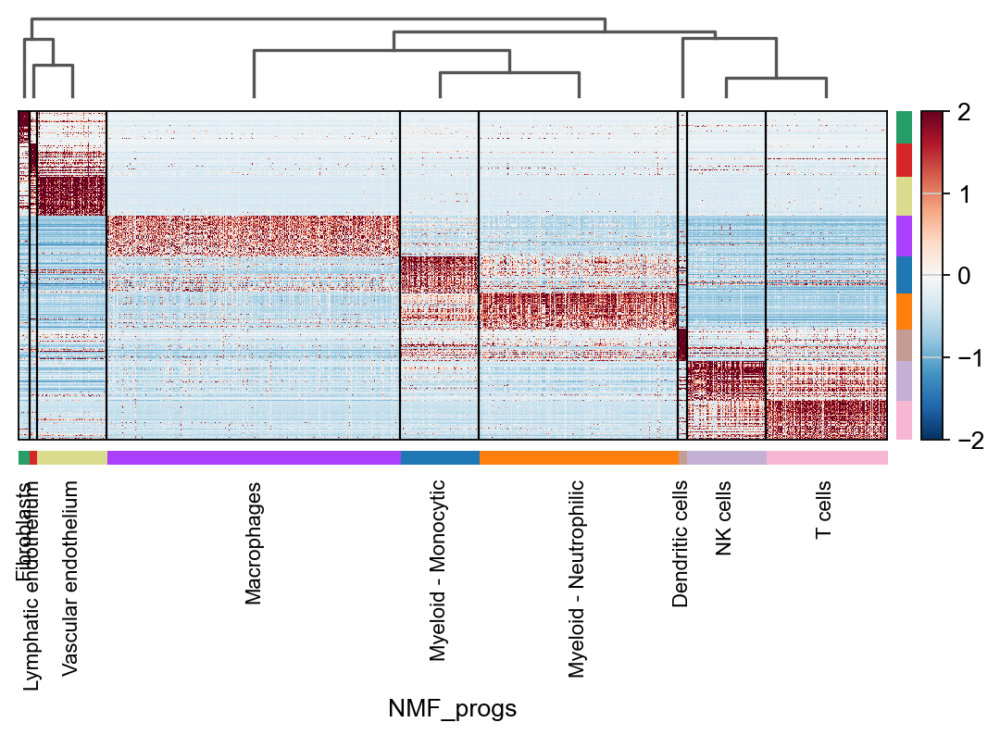

In [162]:
fig=sc.pl.heatmap(adata_imm, 
                   nmf_genes_imm, 
              groupby='NMF_progs', 
              layer='scaled', 
              vmin=-2, vmax=2, 
              cmap='RdBu_r', 
              dendrogram=True, 
              swap_axes=True, 
              figsize=(8,4),
              log=False,
              show_gene_labels=False,
              #save='immune_NMF_heatmap.png'
                     )

In [370]:
# now plot malignant cells (subset adata)
adata_maligs = adata[adata.obs.celltype == 'Malignant cells']

In [371]:
adata_maligs.obs.NMF_progs.value_counts()

NMF_progs
Malignant cells - Hybrid EM                         2397
Malignant cells - Wnt/Slit-Robo signaling           1762
Malignant cells - Basal-like                        1576
Malignant cells - Elf3(+)                            891
Malignant cells - Stress                             858
Malignant cells - Interferon response/chemotaxis     839
Malignant cells - Cycling                            498
Malignant cells - Unclassified                        42
T cells                                               31
Dendritic cells - Monocyte-derived                     7
NK cells                                               7
Neutrophils                                            1
Name: count, dtype: int64

In [378]:
# remove small number of immune cells leftover
adata_maligs = adata_maligs[adata_maligs.obs['NMF_progs'].str.startswith('Malignant')]

In [450]:
# remove unclassified program
adata_maligs_filt = adata_maligs[adata_maligs.obs['NMF_progs'] != 'Malignant cells - Unclassified']

In [451]:
adata_maligs_filt.obs.NMF_progs.value_counts()

NMF_progs
Malignant cells - Hybrid EM                         2397
Malignant cells - Wnt/Slit-Robo signaling           1762
Malignant cells - Basal-like                        1576
Malignant cells - Elf3(+)                            891
Malignant cells - Stress                             858
Malignant cells - Interferon response/chemotaxis     839
Malignant cells - Cycling                            498
Name: count, dtype: int64

In [453]:
# set order for heatmap
desired_order = ['Malignant cells - Interferon response/chemotaxis', 
                 'Malignant cells - Cycling', 
                 'Malignant cells - Wnt/Slit-Robo signaling',
                 'Malignant cells - Basal-like',
                 'Malignant cells - Stress',
                 'Malignant cells - Hybrid EM',
                 'Malignant cells - Elf3(+)',
                ]

# convert the NMF_progs column to a categorical variable with the specified order
adata_maligs_filt.obs['NMF_progs'] = pd.Categorical(adata_maligs_filt.obs['NMF_progs'], categories=desired_order, ordered=True)


/var/folders/5n/z6n7v0d52cz96tmj0j15w_g80000gn/T/ipykernel_2413/793370023.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_maligs_filt.obs['NMF_progs'] = pd.Categorical(adata_maligs_filt.obs['NMF_progs'], categories=desired_order, ordered=True)


In [460]:
# get the categories of NMF_progs and convert them to a list
categories = list(adata_maligs_filt.obs['NMF_progs'].cat.categories)

# sort the keys of nmf_genes_maligs based on the order of categories
sorted_keys = sorted(nmf_genes_maligs.keys(), key=lambda x: categories.index(x))

# create a new dictionary with the sorted keys
sorted_nmf_genes_maligs = {key: nmf_genes_maligs[key] for key in sorted_keys}

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/pandas/core/internals/blocks.py:366: RuntimeWarning: invalid value encountered in log1p
  result = func(self.values, **kwargs)


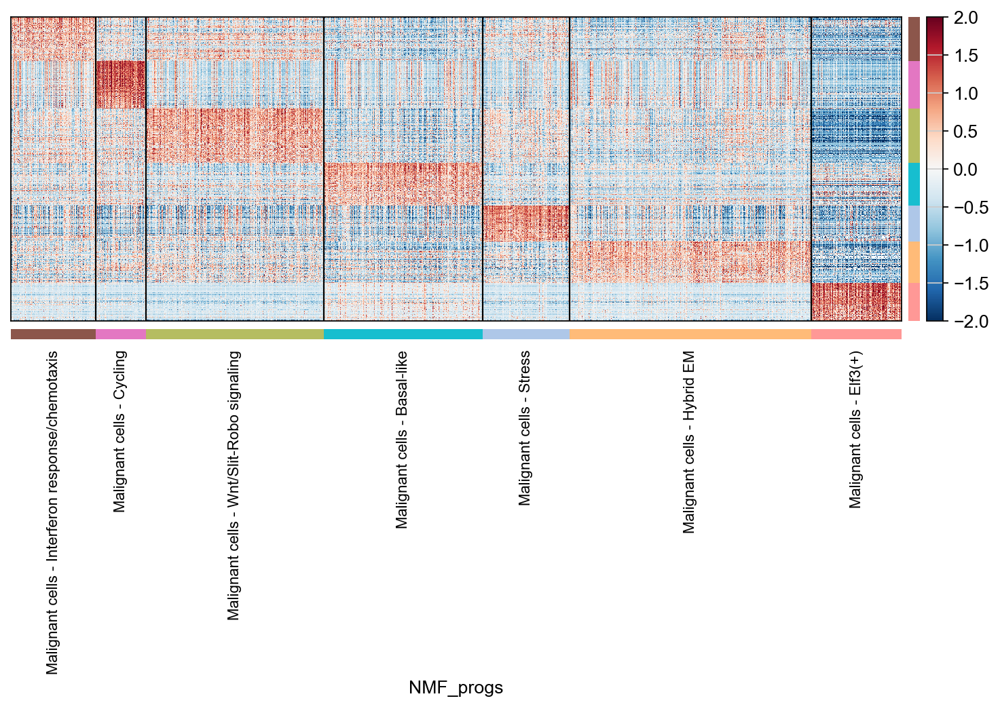

In [468]:
# plot malignant cell programs
fig=sc.pl.heatmap(adata_maligs_filt, 
                   sorted_nmf_genes_maligs, 
              groupby='NMF_progs', 
              layer='scaled', 
              vmin=-2, vmax=2, 
              cmap='RdBu_r', 
              dendrogram=False, 
              swap_axes=True, 
              figsize=(11,4),
              log=True,
              show_gene_labels=False,
              save='Maligs_NMF_heatmap.png'
                     )
    

## 10. Plot usage histograms for each malignant cell program

In [29]:
# simple function to return dict keys containing a value of interest

def find_key_by_value(dictionary, target_value):
    for key, value in dictionary.items():
        if value == target_value:
            return key
    # If the target value is not found, return None
    return None

In [37]:
# plotting function
def plot_overlayed_histogram(adata, program, colors, save_figure=False, file_name=None, height=2, aspect=.5):
    # filter data for the specified program
    program_data = adata.obs[adata.obs['NMF_progs'] == program]

    program_usage = find_key_by_value(nmfDict, program)
    
    # create overlaid KDE plot
    g = sns.displot(
        data=program_data,
        x=program_usage,
        hue=adata.obs['sample'],
        kind="kde",
        fill=True,
        palette=colors,
        height=height,
        aspect=aspect,
        legend=False
    )
    
    # access the underlying Axes object
    ax = g.ax

    # axes limits and labels
    ax.set_xlim(0, 1.2)
    ax.set_title('')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.grid(False)

    # tick styling: major only, left and bottom, pointing out
    ax.tick_params(
        axis='both',
        which='major',
        direction='out',
        length=5,
        width=1,
        colors='black',
        bottom=True,
        left=True,
        top=False,
        right=False
    )

    # save the figure if specified
    if save_figure and file_name:
        plt.savefig(file_name, dpi=600, bbox_inches='tight')

    plt.show()


In [33]:
adata_maligs = adata[adata.obs.celltype == 'Malignant cells']

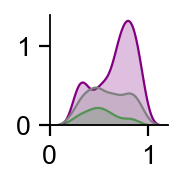

In [39]:
plot_overlayed_histogram(adata_maligs, 'Malignant cells - Elf3(+)', ['grey','purple','limegreen'], height=1.5, aspect=1, save_figure=True, file_name='Elf3_small.png')


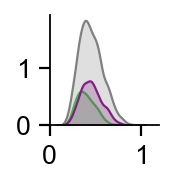

In [40]:
plot_overlayed_histogram(adata_maligs, 'Malignant cells - Hybrid EM', ['grey','purple','limegreen'], height=1.5, aspect=1, save_figure=True, file_name='HEM_small.png')


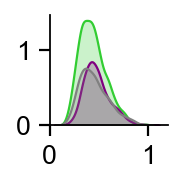

In [41]:
plot_overlayed_histogram(adata_maligs, 'Malignant cells - Wnt/Slit-Robo signaling', ['grey','purple','limegreen'], height=1.5, aspect=1, save_figure=True, file_name='WNT_small.png')


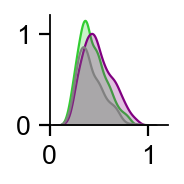

In [42]:
plot_overlayed_histogram(adata_maligs, 'Malignant cells - Basal-like', ['grey','purple','limegreen'], height=1.5, aspect=1, save_figure=True, file_name='Basal_small.png')


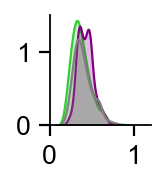

In [43]:
plot_overlayed_histogram(adata_maligs, 'Malignant cells - Stress', ['grey','purple','limegreen'], height=1.5, aspect=1, save_figure=True, file_name='Stress_small.png')


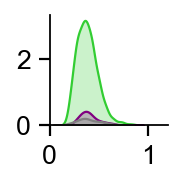

In [44]:
plot_overlayed_histogram(adata_maligs, 'Malignant cells - Interferon response/chemotaxis', ['grey','purple','limegreen'], height=1.5, aspect=1, save_figure=True, file_name='IFN_small.png')


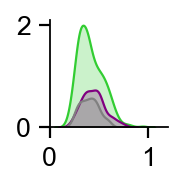

In [45]:
plot_overlayed_histogram(adata_maligs, 'Malignant cells - Cycling', ['grey','purple','limegreen'], height=1.5, aspect=1, save_figure=True, file_name='Cycle_small.png')


## 11. Plot usage scores for ICB-resistance and IFN-response in 2-dim embedding

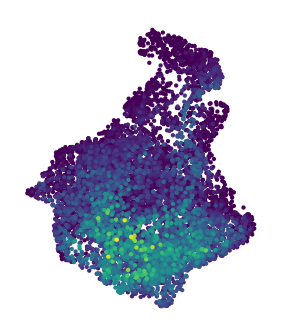

In [128]:
with rc_context({'figure.figsize': (2, 2.5)}):
    sc.pl.umap(adata_maligs[adata_maligs.obs['leiden']!='11'], color = 'Usage_5',frameon = False, title='', size=15,color_map='viridis',colorbar_loc=None, save='umap_IFN.png')

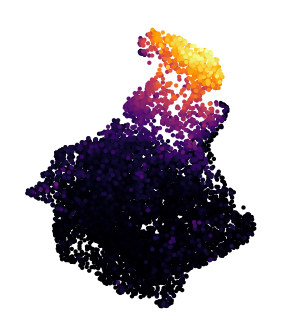

In [129]:
with rc_context({'figure.figsize': (2, 2.5)}):
    sc.pl.umap(adata_maligs[adata_maligs.obs['leiden']!='11'], color = 'Usage_8',frameon = False, title='', size=15,color_map='inferno',colorbar_loc=None, save='umap_ICBres.png')

## 12. Make figure-quality 2-dim embedding plots

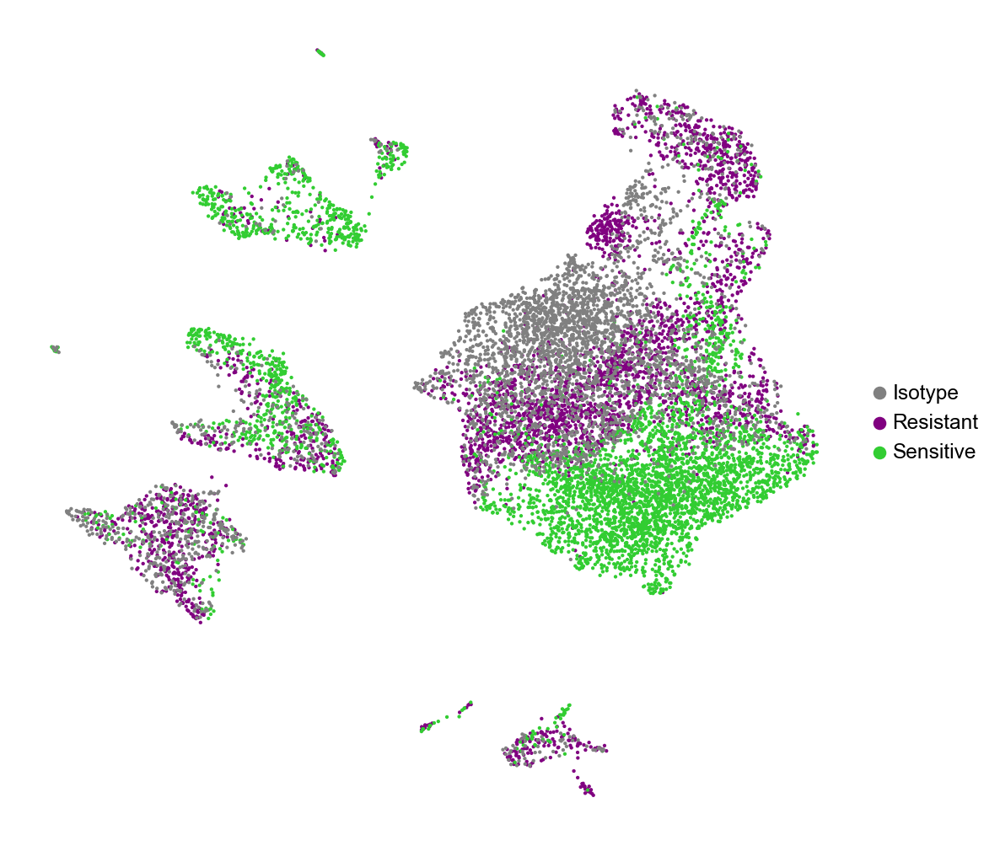

In [5]:
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.umap(adata, color = 'sample',frameon = False, title='', size=15, save='umap_sample_grey.png')

/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/usr/local/Caskroom/mambaforge/base/envs/scvi/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


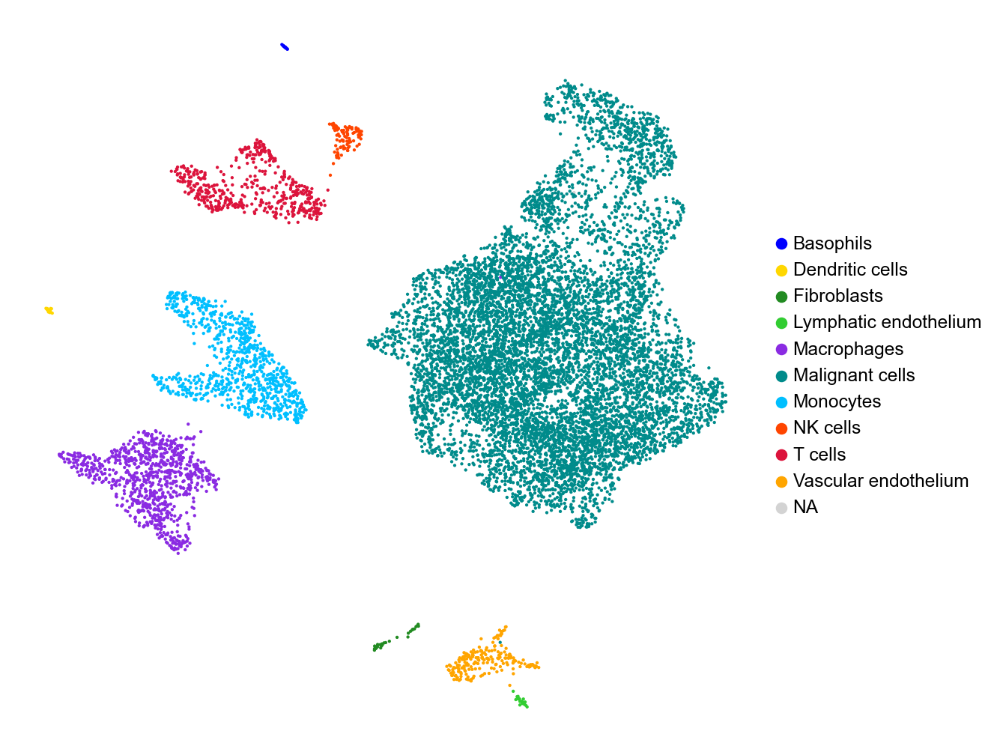

In [567]:
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.umap(adata, color = 'celltype',frameon = False, title='', size=15,palette=color_dict, save='umap_celltype.png')

## 13. Plot TFs associated with ICB-resistance program

In [368]:
# read in gene loadings
gene_spectra = pd.read_csv('./cNMF_outs_run2/cNMF_run2/cNMF_run2.gene_spectra_score.k_17.dt_0_05.txt', sep = '\t')
gene_spectra = gene_spectra.T

In [369]:
# re-create the scvi normalized expression matrix
scvi_normalized_df = pd.DataFrame(
    adata.layers['scvi_normalized'].T, 
    index=adata.var.index, 
    columns=adata.obs.index  
)
scvi_normalized_df = scvi_normalized_df.T

In [370]:
# restrict to the ICB-resistance program
scvi_normalized_df = scvi_normalized_df[list(topgenes[8])]

In [371]:
# reindex adata.obs to align with scvi_normalized_df
obs_aligned = adata_maligs.obs.reindex(scvi_normalized_df.index)

# create boolean filters based on the reindexed obs
elf3_cells = obs_aligned['NMF_progs'] == 'Malignant cells - Elf3(+)'
elf3neg_cells = obs_aligned['NMF_progs'] != 'Malignant cells - Elf3(+)'

# calculate median expression values for each group
elf3_cells_median = scvi_normalized_df[elf3_cells].median(axis=0)
elf3neg_cells_median = scvi_normalized_df[elf3neg_cells].median(axis=0)

# create the exp_score DataFrame
exp_score = pd.DataFrame({
    'Elf3_cells': elf3_cells_median,
    'Elf3neg_cells': elf3neg_cells_median
}).T  # transpose to get genes as columns and conditions as rows

# set index and column names for clarity
exp_score.index.name = 'Condition'
exp_score.columns.name = 'Gene'
exp_score = exp_score.T

In [372]:
# define expression specificity score
exp_score['exp_score'] = exp_score['Elf3_cells']/exp_score['Elf3neg_cells']

In [373]:
# subset loadings to ICB-resistance program
gene_spectra_elf = gene_spectra[7]
filtered_gene_spectra_elf = gene_spectra_elf.loc[gene_spectra_elf.index.isin(topgenes[8])]

In [374]:
# reset index of filtered_gene_spectra_elf to use 'Gene' for merging
filtered_gene_spectra_elf_reset = filtered_gene_spectra_elf.reset_index()
filtered_gene_spectra_elf_reset.columns = ['Gene', 'nmf_score']  # Rename columns

# merge with exp_score on 'Gene', using 'outer' to keep all rows from exp_score
merged_df = exp_score.merge(filtered_gene_spectra_elf_reset, on='Gene', how='left')

merged_df

,Gene,Elf3_cells,Elf3neg_cells,exp_score,nmf_score
0,Prss27,48.526173,0.418875,115.848763,0.005853
1,Elf3,31.099787,1.301792,23.889988,0.005541
2,Desi1,15.833441,3.875607,4.085410,0.005512
3,Ltf,136.320557,1.219966,111.741280,0.005446
4,Pglyrp4,7.989408,0.258887,30.860588,0.005385
...,...,...,...,...,...
95,Gm49439,0.937530,0.002742,341.897522,0.003551
96,Grhl1,2.882545,0.596718,4.830664,0.003546
97,Gfpt1,10.092090,5.014386,2.012627,0.003519
98,Trim16,3.145247,0.904228,3.478378,0.003510


In [375]:
# set default gene type as non-TF (for plotting)
merged_df['marker_type']='Non-TFs'

In [376]:
# define TFs
TFs = ['Elf3', 'Grhl1', 'Nupr1', 'Irf7']

# update the 'marker_type' for the specified genes
merged_df.loc[merged_df['Gene'].isin(TFs), 'marker_type'] = 'TFs'

In [377]:
# log transform the expression score
merged_df['log_exp_score'] = np.log2(merged_df['exp_score'])

In [378]:
# adjust the scores (loadings for any given gene are extremely low numbers)
merged_df['adj_NMF_score'] = merged_df['nmf_score']*10000

In [379]:
# check dataframe structure
merged_df[merged_df['marker_type']=='TFs']

,Gene,Elf3_cells,Elf3neg_cells,exp_score,nmf_score,marker_type,log_exp_score,adj_NMF_score
1,Elf3,31.099787,1.301792,23.889988,0.005541,TFs,4.578334,55.407920
38,Nupr1,134.330811,17.581120,7.640629,0.004500,TFs,2.933691,45.001642
41,Irf7,18.859203,5.380036,3.505404,0.004432,TFs,1.809581,44.318105
96,Grhl1,2.882545,0.596718,4.830664,0.003546,TFs,2.272222,35.461118


In [380]:
merged_df=merged_df.set_index('Gene')

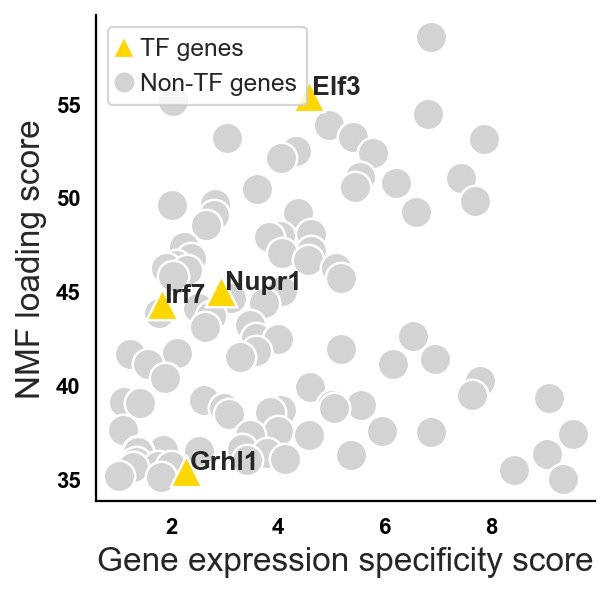

In [381]:
# list TFs that will have text labels
labels = ['Elf3', 'Grhl1', 'Nupr1', 'Irf7']

plt.figure(figsize=(4, 4))

# create scatter plot for Non-TFs
non_tfs = merged_df[merged_df['marker_type'] == 'Non-TFs']
sns.scatterplot(data=non_tfs, x='log_exp_score', y='adj_NMF_score', color='lightgrey', marker='o', s=200)

# create scatter plot for TFs
tfs = merged_df[merged_df['marker_type'] == 'TFs']
sns.scatterplot(data=tfs, x='log_exp_score', y='adj_NMF_score', color='gold', marker='^', s=200)

# labels for specific genes
label_params = []
for gene in labels:
    params = merged_df[merged_df.index == gene]
    exp = params['log_exp_score'].values[0]
    score = params['adj_NMF_score'].values[0]
    symbL = gene
    label_params.append(plt.text(x=exp, y=score, s=symbL, fontsize=12, weight='bold'))

# use adjust_text to avoid overlapping labels
adjust_text(label_params)

# customize plot labels and title
plt.xlabel('Gene expression specificity score', size=15)
plt.ylabel('NMF loading score', size=15)
plt.title('')
plt.xticks(size=10, weight='bold')
plt.yticks(size=10, weight='bold')
for axis in ['bottom', 'left']:
    plt.gca().spines[axis].set_linewidth(1)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# add legend
# manually create legend handles and labels
legend_handles = [plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='gold', markersize=10, label='TFs'),
                             plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightgrey', markersize=10, label='Non-TFs')]
legend_labels = ['TF genes', 'Non-TF genes']
plt.legend(handles=legend_handles, labels=legend_labels, loc='upper left')
plt.grid(False)
#plt.savefig('NMF_TF_plot.png', dpi = 300)
# Show the plot
plt.show()

## 14. Psuedobulk differential expression analysis

### ICB-resistance vs. IFN-response program

In [53]:
# subset out malignant cells for pseudobulk ("pb") analysis
adata_malig_pb = new_adata[new_adata.obs['NMF_progs'].str.startswith('Malignant')]

In [74]:
adata_malig_pb.obs['pb_comp'] = adata_malig_pb.obs['NMF_progs']

In [76]:
# subset out IFN response and ICB resistance programs
adata_ifn_elf = adata_malig_pb[adata_malig_pb.obs['pb_comp'].isin(['Malignant cells - Elf3(+)','Malignant cells - Interferon response/chemotaxis'])]

In [77]:
adata_ifn_elf.obs['pb_comp'].value_counts()

pb_comp
Malignant cells - Elf3(+)                           891
Malignant cells - Interferon response/chemotaxis    839
Name: count, dtype: int64

In [78]:
# make pseudo-replicates
pbs = []
for condition in adata_ifn_elf.obs.pb_comp.unique():
    # select cells matching this condition
    samp_cell_subset = adata_ifn_elf[adata_ifn_elf.obs['pb_comp'] == condition]
    # replace X with scvi-normalized counts
    samp_cell_subset.X = samp_cell_subset.layers['scvi_normalized']
    # shuffle cell names for random grouping
    indices = list(samp_cell_subset.obs_names)
    random.shuffle(indices)
    # split into 3 pseudo-replicate groups
    indices = np.array_split(np.array(indices), 3)
    for i, pseudo_rep in enumerate(indices):
        # sum counts across cells in this pseudo-replicate
        rep_adata = sc.AnnData(
            X=samp_cell_subset[indices[i]].X.sum(axis=0),
            var=samp_cell_subset[indices[i]].var[[]]
        )
        # set a unique name for this replicate
        rep_adata.obs_names = [f"{condition}_{i}"]
        # record condition and replicate index
        rep_adata.obs['pb_comp'] = samp_cell_subset.obs['pb_comp'].iloc[0]
        rep_adata.obs['replicate'] = i
        # add to list of pseudo-bulk samples
        pbs.append(rep_adata)

/usr/local/Caskroom/mambaforge/base/envs/scrna/lib/python3.12/site-packages/anndata/_core/storage.py:85: ImplicitModificationWarning: X should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)
/usr/local/Caskroom/mambaforge/base/envs/scrna/lib/python3.12/site-packages/anndata/_core/storage.py:85: ImplicitModificationWarning: X should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)
/usr/local/Caskroom/mambaforge/base/envs/scrna/lib/python3.12/site-packages/anndata/_core/storage.py:85: ImplicitModificationWarning: X should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)
/usr/local/Caskroom/mambaforge/base/envs/scrna/lib/python3.12/site-packages/anndata/_core/storage.py:85: ImplicitModificationWarning: X should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)
/usr/local/Caskroom/mambaforge/base/envs/scrna/lib/p

In [79]:
# combine
pb = sc.concat(pbs)

In [80]:
pb.obs

,pb_comp,replicate
Malignant cells - Elf3(+)_0,Malignant cells - Elf3(+),0
Malignant cells - Elf3(+)_1,Malignant cells - Elf3(+),1
Malignant cells - Elf3(+)_2,Malignant cells - Elf3(+),2
Malignant cells - Interferon response/chemotaxis_0,Malignant cells - Interferon response/chemotaxis,0
Malignant cells - Interferon response/chemotaxis_1,Malignant cells - Interferon response/chemotaxis,1
Malignant cells - Interferon response/chemotaxis_2,Malignant cells - Interferon response/chemotaxis,2


In [81]:
# create counts matrix now with pseudoreplicates
counts = pd.DataFrame(pb.X, columns = pb.var_names) #need to do this to pass var names


In [82]:
counts

,Xkr4,Sox17,St18,2610203C22Rik,Cpa6,Prex2,Sulf1,Slco5a1,Eya1,Kcnb2,...,Arhgap6,Mid1,Gm15726,Gm21860,Gm47283,AC133103.1,AC168977.2,AC168977.1,AC132444.1,Csprs
0,6.081854,6.765046,11.742839,339.039745,206.309770,127.418930,671.068998,4.496717,3.522806,103.314257,...,40.549888,963.344405,33.770090,7.807281,155.030777,383.456608,312.187169,2083.926742,174.034154,325.773620
1,5.286902,7.682335,11.012598,333.373238,238.506451,117.249694,666.014542,4.275460,4.566521,93.455023,...,39.670542,948.387031,31.247621,6.243109,160.828238,368.449801,312.739103,2055.478539,197.929429,344.791409
2,4.967645,7.698974,9.273485,350.721677,234.802642,117.219825,640.136057,3.574374,1.563834,98.542753,...,37.291781,902.699953,29.521561,5.841157,144.135489,378.120115,327.305814,2321.978332,153.387049,373.171238
3,10.877175,3.456651,81.835041,151.326070,2351.286769,165.177900,460.795816,41.877730,24.488275,174.375467,...,624.281147,7698.583598,80.710426,19.187872,259.863771,72.418234,145.551590,654.872792,1.501014,305.383800
4,10.548918,3.339672,78.852588,181.378783,2439.991509,221.342023,549.913143,35.003072,40.365770,233.613042,...,703.700449,8206.787930,84.712323,23.008323,286.339992,79.904450,144.515088,645.328924,0.645374,289.269131
5,9.373318,2.529931,70.995874,145.211178,2473.713942,163.408698,509.720701,43.673856,28.915688,199.899010,...,614.661652,7633.477757,89.110730,19.487861,253.843429,75.695821,145.447730,684.030481,0.989046,303.825485


In [83]:
# round to avoid DESeq error
counts_rounded = counts.round().astype(int)

In [85]:
# initialize DESeq2
dds = DeseqDataSet(
    counts = counts_rounded,
    metadata = pb.obs,
    design_factors="pb_comp")


/var/folders/5n/z6n7v0d52cz96tmj0j15w_g80000gn/T/ipykernel_12643/2425198052.py:1: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(


In [87]:
# run
dds.deseq2()

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.20 seconds.

Fitting dispersion trend curve...
/usr/local/Caskroom/mambaforge/base/envs/scrna/lib/python3.12/site-packages/pydeseq2/dds.py:715: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.25 seconds.

Fitting LFCs...
... done in 0.14 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.



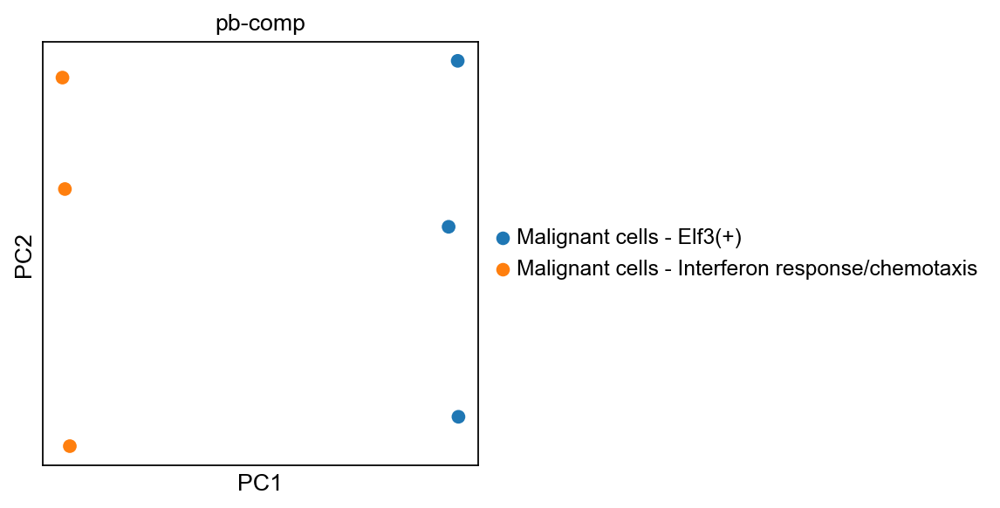

In [88]:
# plot PCA
sc.tl.pca(dds)
sc.pl.pca(dds, color = 'pb-comp', size = 200)

In [89]:
# get statistical testing results
stat_res = DeseqStats(dds, contrast=('pb-comp', 'Malignant cells - Elf3(+)', 
                                     'Malignant cells - Interferon response/chemotaxis'))
    
stat_res.summary()

Log2 fold change & Wald test p-value: pb-comp Malignant cells - Elf3(+) vs Malignant cells - Interferon response/chemotaxis
                  baseMean  log2FoldChange     lfcSE       stat  \
Xkr4              7.482517       -0.373520  0.456941  -0.817437   
Sox17             5.919678        1.934506  0.577548   3.349518   
St18             38.138969       -2.277758  0.289931  -7.856215   
2610203C22Rik   273.530222        1.683060  0.120815  13.930933   
Cpa6           1128.684634       -2.835793  0.100406 -28.243268   
...                    ...             ...       ...        ...   
AC133103.1      261.194495        2.889212  0.133075  21.711217   
AC168977.2      253.582719        1.707834  0.117449  14.541069   
AC168977.1     1588.908645        2.285362  0.101670  22.478258   
AC132444.1      107.430285        7.616025  0.732321  10.399838   
Csprs           335.513146        0.798771  0.113653   7.028124   

                      pvalue           padj  
Xkr4            4.136790e

Running Wald tests...
... done in 0.13 seconds.



In [90]:
de  = stat_res.results_df

In [91]:
# sort de genes by descending stat value
de = de.sort_values('stat', ascending = False)


In [92]:
de.to_csv('elf3_vs_ifn_deseq.csv')

In [158]:
# remove NaN values
de = de.dropna(subset=['stat'])

In [159]:
de

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
Psca,67180.368340,7.559064,0.091610,82.513880,0.000000e+00,0.000000e+00
Krt19,12468.108725,5.352975,0.076184,70.263689,0.000000e+00,0.000000e+00
Prss22,9623.244064,5.051062,0.075932,66.521078,0.000000e+00,0.000000e+00
Asprv1,10659.181975,6.809584,0.104356,65.253324,0.000000e+00,0.000000e+00
Mal,10004.661903,5.721049,0.090060,63.524865,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...
Plcb1,4646.767743,-2.824210,0.080432,-35.113116,4.251824e-270,1.816743e-268
Tnc,5911.464834,-3.010768,0.082898,-36.319116,8.077795e-289,3.896885e-287
Tenm3,2225.176013,-3.445483,0.091187,-37.785006,0.000000e+00,0.000000e+00
Cyp7b1,3701.571421,-3.370940,0.086176,-39.117000,0.000000e+00,0.000000e+00


In [186]:
# replace 0 p vals with non-zero value
de['pvalue'] = de['pvalue'].replace(0.0, 8e-400)

/var/folders/5n/z6n7v0d52cz96tmj0j15w_g80000gn/T/ipykernel_81018/1785879620.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  de['pvalue'] = de['pvalue'].replace(0.0, 8e-400)


In [187]:
# replace 0 p vals with non-zero value
de['padj'] = de['padj'].replace(0.0, 3e-400)

/var/folders/5n/z6n7v0d52cz96tmj0j15w_g80000gn/T/ipykernel_81018/2701820602.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  de['padj'] = de['padj'].replace(0.0, 3e-400)


In [188]:
# create -log10 p val entry
de['nlog10'] = -np.log10(de['padj'])

/var/folders/5n/z6n7v0d52cz96tmj0j15w_g80000gn/T/ipykernel_81018/1061092729.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  de['nlog10'] = -np.log10(de['padj'])


In [189]:
# create a symbol entry in the dataframe
de['symbol'] = de.index

/var/folders/5n/z6n7v0d52cz96tmj0j15w_g80000gn/T/ipykernel_81018/3452944987.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  de['symbol'] = de.index


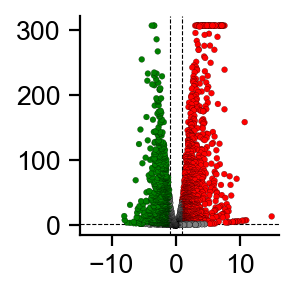

In [239]:
fig, ax = plt.subplots(figsize=(2, 2))

# create a scatter plot
sns.scatterplot(
    data=de[de['color'].isin(['sigpos', 'signeg', 'ns'])],
    x='log2FoldChange', y='nlog10', hue='color',
    hue_order=['ns', 'signeg', 'sigpos'],
    palette=['grey', 'green', 'red'],
    legend=False, ax=ax,
    edgecolor='black', linewidth=0.1, s=7
)

# add threshold lines
ax.axhline(2, zorder=0, c='k', lw=0.5, ls='--')
ax.axvline(1, zorder=0, c='k', lw=0.5, ls='--')
ax.axvline(-1, zorder=0, c='k', lw=0.5, ls='--')

ax.grid(False)

# format axes
for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(1)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(
    axis='both',
    which='major',
    direction='out',
    length=5,
    width=1,
    colors='black',
    bottom=True,
    left=True,
    top=False,
    right=False
)

ax.set_xlabel('')
ax.set_ylabel('')
plt.xlim(-15,16)

plt.tight_layout()
plt.savefig('ifn_elf_deseq_volcano_small.png', dpi=600)
plt.show()


## 15. Plot gene ontology results

In [306]:
# txt output from Enrichr GO analysis
df = pd.read_csv("GO_ICBres.txt", sep="\t") 

In [307]:
# columns to keep
subset = df.iloc[0:5]

In [308]:
subset

,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,Defense Response to Bacterium (GO:0042742),42/221,5.039517e-11,1.671104e-07,0,0,3.668545,86.985321,WFDC12;PGLYRP4;PGLYRP3;CALCA;ADM;DEFB1;TREM2;C...
1,Skin Development (GO:0043588),21/69,4.967549e-10,5.853432e-07,0,0,6.768957,145.010846,RYR1;FLG;ERRFI1;SPRR2F;SPRR3;ST14;ANXA1;CDSN;W...
2,Blood Vessel Morphogenesis (GO:0048514),18/51,5.671638e-10,5.853432e-07,0,0,8.425092,179.373346,TBX1;CCBE1;EGFL7;RAMP2;SYK;SLC1A1;PROX1;RASIP1...
3,Regulation of Inflammatory Response (GO:0050727),43/249,7.060835e-10,5.853432e-07,0,0,3.261617,68.726469,SEMA7A;TNFAIP6;CLEC12A;CXCL17;LPL;ADAMTS12;TNF...
4,Positive Regulation of Cytokine Production (GO...,50/325,1.881228e-09,1.247630e-06,0,0,2.847202,57.204105,ORM1;CSF2;CD80;HILPDA;CXCL17;TNF;CYP1B1;IL12B;...


Font 'default' does not have a glyph for '\u202f' [U+202f], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u202f' [U+202f], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u202f' [U+202f], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u202f' [U+202f], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u202f' [U+202f], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u202f' [U+202f], substituting with a dummy symbol.


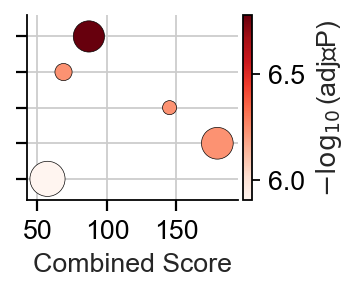

In [314]:
df = subset
# extract "hits" and "background" values from the "Overlap" field
df[['Hits','Background']] = (
    df['Overlap']
      .str.split('/', expand=True)
      .astype(int)
)

# -log10 p value with a pseudocount ("safe")
eps = 1e-300
df['adjP_safe'] = df['Adjusted P-value'].replace(0, eps)
df['nlog10_adjP'] = -np.log10(df['adjP_safe'])

# shorten long GO term names for plotting
def shorten(term, n_words=5):
    # keep first n_words words before the first parenthesis
    label = term.split('(')[0].strip()
    words = label.split()[:n_words]
    return ' '.join(words) + (' …' if len(label.split()) > n_words else '')
# apply shortening function
df['Term_short'] = df['Term'].apply(shorten)

# sort terms by FDR then Combined Score
df = df.sort_values(['Adjusted P-value', 'Combined Score'])

# plot

plt.figure(figsize=(2.5, 2))
sns.scatterplot(
    data=df,
    x='Combined Score',
    y='Term_short',
    size=list(subset.Hits),
    sizes=(40, 250),
    hue='nlog10_adjP',
    palette='Reds',
    edgecolor='black',
    linewidth=0.3,
    legend=False
)

# style tweaks
ax = plt.gca()
ax.set_xlabel('Combined Score')
ax.set_ylabel('')

# remove GO term labels
ax.set_yticklabels([])

# padding to prevent circles from getting cut off
ax.margins(y=0.15, x=.12)

ax.tick_params(direction='out', length=5, width=1,
               bottom=True, left=True, top=False, right=False)

sns.despine(ax=ax)

# create colorbar for p-val
sm = plt.cm.ScalarMappable(cmap='Reds',
                           norm=plt.Normalize(df['nlog10_adjP'].min(),
                                              df['nlog10_adjP'].max()))
# final formatting
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, pad=0.02)
cbar.set_label(r'$-\log_{10}$(adj P)')

#save and show plot
plt.tight_layout()
plt.savefig('go_dotplot.png', dpi=600, bbox_inches='tight')
plt.show()